<a href="https://colab.research.google.com/github/michalispsy/Computer-Architecture/blob/main/DSP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ΨΗΦΙΑΚΗ ΕΠΕΞΕΡΓΑΣΙΑ ΣΗΜΑΤΩΝ      

**1η ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ**


---



###Τσουρούφλη Ζωή - 03122062  
###Ψυχής Μιχάλης - 03122094


---
**Θέμα:** Εισαγωγή στην Ψηφιακή Επεξεργασία Σημάτων με
Python και Εφαρμογές σε Ακουστικά Σήματα



       





#**Μέρος 1ο - Σύστημα Εντοπισμού Τηλεφωνικών Τόνων (Telephone Touch – Tones)**


In [22]:
!pip install sounddevice
!apt install libportaudio2

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import IPython
import sounddevice as sd
import soundfile as sf
import librosa
import librosa.display
from scipy.io.wavfile import write
from scipy.signal import find_peaks
from IPython.display import Audio
from scipy.signal import stft
from scipy.signal import butter, lfilter
import scipy.signal as sc



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libportaudio2 is already the newest version (19.6.0-1.1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.


## Ερώτημα 1.1


---
Θα χρησιμοποιήσουμε τη βιβλιοθήκη numpy. Με δεδομένο μήκος 1000 δείγματα, κατασκευάζουμε 10 διαφορετικά σήματα για τους αντίστοιχους 10 διαφορετικούς τόνους που δίνονται. Για να το πετύχουμε αυτό φτιάχνουμε με την np.arrange() έναν πίνακα με ακεραίους 0-999. Στη συνέχεια δημιουργούμε τα σήματα ως υπέρθεση των αντίστοιχων δύο ημιτόνων με την np.sin(). Λαμβάνουμε υπόψιν μας τη συχνότητα δειγματοληψίας κατά τη χρήση της εντολής Audio για να ακούσουμε τα σήματα που δημιουργήσαμε.



In [74]:
samples = 1000
sample_rate = 8192
n = np.arange(0,samples)
d = []
d.append(np.sin(0.7217 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.5346 * n) + np.sin(0.9273 * n))
d.append(np.sin(0.5346 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.5346 * n) + np.sin(1.1328 * n))
d.append(np.sin(0.5906 * n) + np.sin(0.9273 * n))
d.append(np.sin(0.5906 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.5906 * n) + np.sin(1.1328 * n))
d.append(np.sin(0.6535 * n) + np.sin(0.9273 * n))
d.append(np.sin(0.6535 * n) + np.sin(1.0247 * n))
d.append(np.sin(0.6535 * n) + np.sin(1.1328 * n))
IPython.display.Audio(d[0], rate=sample_rate)

## Eρώτημα 1.2


---
Με την εντολή np.fft.fft() υπολογίζουμε τον DFT και επιλέγουμε μάλιστα τον αριθμό των σημείων. Προκειμένου να εμφανίσουμε τη γραφική παράσταση των σημάτων ορίζουμε το omega, το οποίο είναι το φάσμα συχνοτήτων για τον άξονα x. Αποτελείται από 1024 σημεία με απόσταση του καθενός μεταξύ τους 1/2π. Στη συνέχεια με την εντολή np.plot() εμφανίζουμε τα DFT των σημάτων και μάλιστα το μέτρο αυτών (np.abs()).



Text(0.5, 1.0, 'DFT of sinusoid')

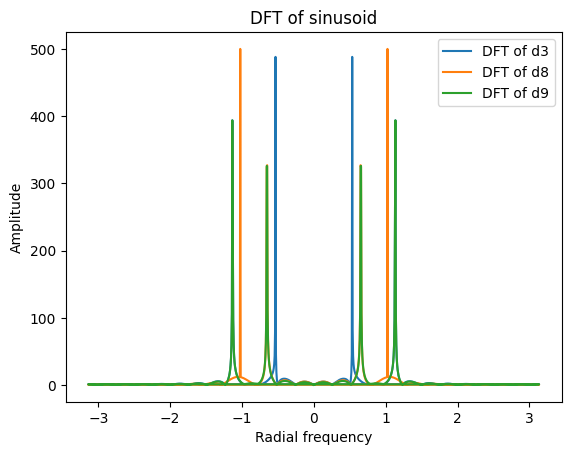

In [24]:
y_3 = np.fft.fft(d[3], 1024)
y_8 = np.fft.fft(d[8], 1024)
y_9 = np.fft.fft(d[9], 1024)
omega = np.fft.fftfreq(1024, 1/(2*np.pi))
plt.plot(omega,np.abs(y_3))
plt.plot(omega,np.abs(y_8))
plt.plot(omega,np.abs(y_9))
plt
plt.legend(['DFT of d3','DFT of d8','DFT of d9'])
plt.ylabel('Amplitude')
plt.xlabel('Radial frequency')
plt.title('DFT of sinusoid')


Πράγματι βλέπουμε ότι τα γραφήματα έχουν άρτια συμμετρία ,κάτι επιθυμητό μετά από τον DFT. Παρατηρούμε επίσης, ότι οι γραφικές παραστάσεις των d8 και d9 έχουν κοινή χαμηλή συχνότητα και για αυτό φαίνεται μόνο η d9. Αυτό ήταν αναμενόμενο, αφού από τις διακριτές συχνότητες ξέρουμε ότι τα σήματα d8, d9 έχουν κοινή Ωrow, που είναι η χαμηλή συχνότητα των τόνων. Αντίστοιχα, παρατηρούμε ότι τα σήματα d3, d9 έχουν κοινή την υψηλή συχνότητα.

## Ερώτημα 1.3


---

Σήμα που πρέπει να αποθηκεύσουμε:
*03122094* + 03122062 = 03122196
Για να δημιουργήσουμε το ζητούμενο σήμα ορίζουμε έναν buffer με 100 μηδενικά με την εντολή np.zeros(). Επίσης δημιουργούμε το σήμα με τους ζητούμενους τόνους (message) και έναν πίνακα buffed_message, στο οποίο θα τοποθετήσουμε το message με τα μηδενικά ενδιάμεσα για να διακρίνονται καλύτερα οι τόνοι. Αυτό το πετυχαίνουμε με την εντολή np.concatenate() συνενώνουμε τους πίνακες των σημάτων που αντιστοιχούν στο ζητούμενο κάθε φορά ψηφίο και του buffer. Με την εντολή write της βιβλιοθήκης soundfile αποθηκεύουμε το νέο σήμα στο αρχείο .wav.


In [25]:
buffer = np.zeros(100)
message = [d[0], d[3], d[1], d[2], d[2], d[1], d[9], d[6]]
buffed_message = []
buffed_message = np.concatenate((buffed_message, message[0]))
for m in message[1:]:
  buffed_message = np.concatenate((buffed_message, buffer, m))

write('users_coded_signal_03122196.wav', sample_rate, buffed_message.astype(np.float32))

## Ερώτημα 1.4


---
Φτιάχνουμε δύο παράθυρα ένα hamming και ενα rectangular μήκους 1000, με τις εντολές np.hamming() και np.ones() αντίστοιχα. Πολλαπλασιάζουμε τους διαφορετικούς τόνους του message που δημιουργήσαμε στο 1.3 με το αντίστοιχο κάθε φορά παράθυρο. Αποθηκεύουμε τα παραθυροποιήμενα σήματα σε έναν πίνακα για κάθε ένα window. Στη συνέχεια εκτελούμε fft (Ν=1024) για το hamming και το rectangular signal και πλοτάρουμε όπως στα από πάνω ερωτήματα.

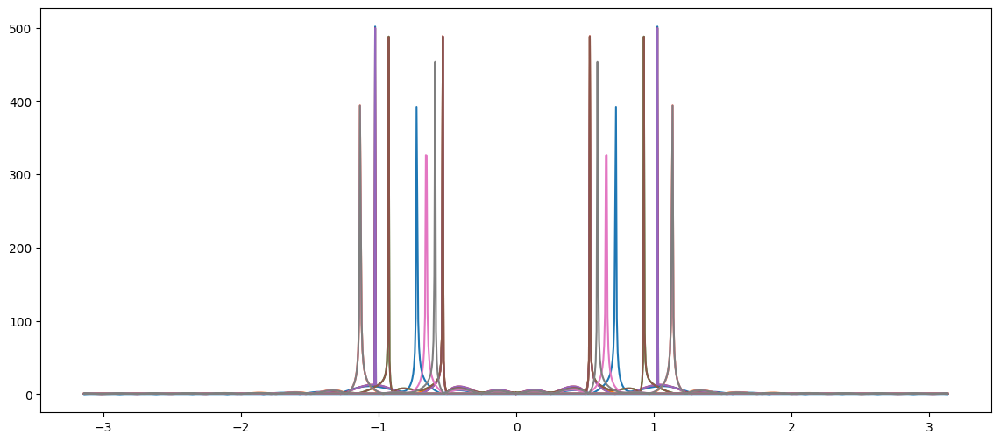

In [26]:
hamming = np.hamming(1000)
rectangular = np.ones(1000)

rectangular_signal = []
hamming_signal = []

fig = plt.subplots(figsize=(14, 6))

for signal in message :
  rectangular_signal.append(signal * rectangular)
  hamming_signal.append(signal * hamming)

fft_rect = []
for signal in rectangular_signal:
  fft = np.abs(np.fft.fft(signal, 1024))
  fft_rect.append(fft)
  plt.plot(omega, np.abs(fft))

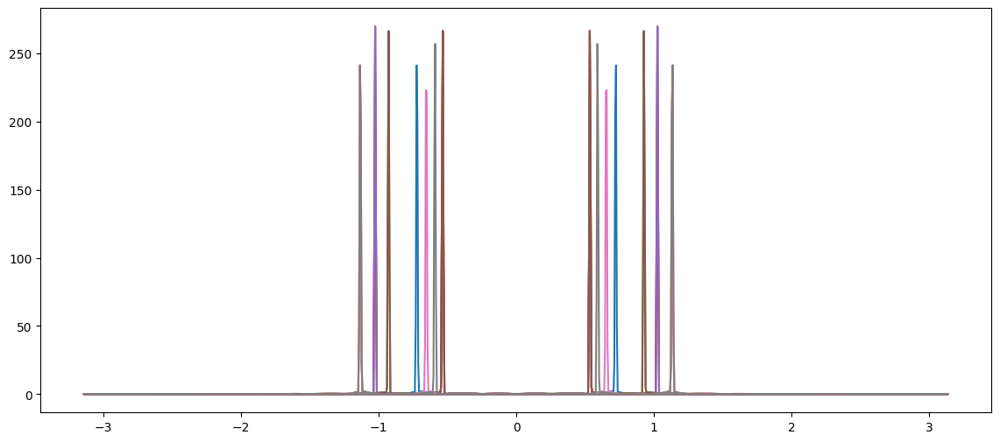

In [27]:
fig = plt.subplots(figsize=(14, 6))
fft_hamm = []
for signal in hamming_signal:
  fft = np.abs(np.fft.fft(signal, 1024))
  fft_hamm.append(fft)
  plt.plot(omega, fft)

## Ερώτημα 1.5


---

Μας ζητείται να βρούμε τους δείκτες k και τις αντίστοιχες συχνότητες που βρίσκονται κοντά στισ touch-tone συχνότητες. Αρχικά εκτελούμε DFT για όλους τα αρχικά μας σήματα. Στη συνέχεια κατανέμουμε με την εντολή np.argsort() τους δείκτες με βάση το πλάτος τουες και κρατάμε αυτούς με τισ 4 μεγαλύτερες τιμές. Χρειαζόμαστε τους 4 τελευταίους γιατί το κάθε σήμα μας έχει δύο τόνους άρα δύο μέγιστες τιμές και λαμβάνουμε υπόψη και τις συμμετρικές τιμές αυτών. Στον πίνακα τελικά αποθηκεύουμε τους 2 από τους 4 δείκτες (συμμετρία). Με τη χρήση της omega αντιστοιχίζουμε τους δείκτες που βρήκαμε στις αντίστοιχες συχνότητες. Για το σήμα 0, βλέπουμε ότι οι συχνότητες που προκύπτουν ταυτίζονται σχεδόν πλήρως με τις touch tone συχνότητες των τόνων (0.724 και 1.024), με ελάχιστες αποκλίσεις.

[118 167]
[ 87 151]
[ 87 167]
[ 87 185]
[ 96 151]
[ 96 167]
[ 96 185]
[107 151]
[106 167]
[107 185]
[[np.int64(118), np.float64(0.7240389318820226), np.int64(167), np.float64(1.0246991663076084)], [np.int64(87), np.float64(0.5338253141842031), np.int64(151), np.float64(0.9265243958829272)], [np.int64(87), np.float64(0.5338253141842031), np.int64(167), np.float64(1.0246991663076084)], [np.int64(87), np.float64(0.5338253141842031), np.int64(185), np.float64(1.1351457830353744)], [np.int64(96), np.float64(0.5890486225480862), np.int64(151), np.float64(0.9265243958829272)], [np.int64(96), np.float64(0.5890486225480862), np.int64(167), np.float64(1.0246991663076084)], [np.int64(96), np.float64(0.5890486225480862), np.int64(185), np.float64(1.1351457830353744)], [np.int64(107), np.float64(0.6565437772150544), np.int64(151), np.float64(0.9265243958829272)], [np.int64(106), np.float64(0.6504078540635119), np.int64(167), np.float64(1.0246991663076084)], [np.int64(107), np.float64(0.656543777215

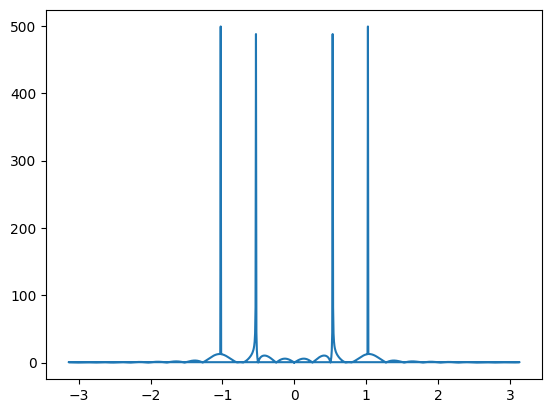

In [28]:
peaks = []
fft_of_all_signals = []

for signal in d:
  fft_of_all_signals.append(np.abs(np.fft.fft(signal, 1024)))

for signal in fft_of_all_signals:
  peak = np.sort(np.argsort(signal)[-4:])[:2]
  print(peak)
  peaks.append([peak[0], omega[peak[0]], peak[1], omega[peak[1]]])

print(peaks)
plt.plot(omega, np.abs(fft_rect[3]))

## Ερώτημα 1.6


---
Αρχικά ορίζουμε με τη size_of πόσους τόνους έχει το σήμα μας (κάθε τόνος αποτελείται απο 1000 samples). Φτιάχνουμε δύο πίνακες (button_low_known, button_high_known) έναν για τισ γνωστές χαμηλές διακριτές συχνότητες και μία για τις υψηλές (Ωrow, Ωcolumn). Φτιάχνουμε και ένα map για να αποθηκεύσουμε τον συνδυασμό των τόνων που αποτελούν το κάθε σήμα. Αποθηκεύουμε στον πίνακα signals, τα διαφορετικά σήματα 1000 samples του συνολικού σήματος εισόδου, τα οποία θα πρέπει να αντιστοιχήσουμε στους τηλεφωνικούς τόνους. Στα διαφορετικά αυτά σήματα κάνουμε fft και βρίσκουμε την ενέργειά τους. Στη συνέχεια, βρίσκουμε με αντίστοιχο τρόπο με το προηγούμενο ερώτημα τα δύο μέγιστα του κάθε σήματος και τα αποθηκέυουμε στους πίνακες button_low και button_high τους οποίους στη συνέχεια θα συγκρίνουμε με τους button_high_known και button_low_known. Mέχρι το σημείο αυτό λοιπόν γνωρίζουμε τις δύο συχνότητες που αντιστοιχούν στους δύο τόνους από τους οποίους αποτελείται το κάθε σήμα. Για να αντιστοιχήσουμε τις συχνότητες αυτές στις δεδομένες διακριτές και έπειτα στους αρχικούς μας τόνους, κρατάμε κάθε φορά την διακριτή συχνότητα που απέχει λιγότερο από αυτή που υπολογίσαμε και με τη βοήθεια του key_map κάνουμε τελικά την αντιστοίχιση.


In [29]:
def ttdecode(message):
  size_of = (len(message)+100)/1100
  signals = []
  fft_signal = []
  energy = []
  button_low = []
  button_high = []
  button_low_known = [0.5346, 0.5906, 0.6535, 0.7217]
  button_high_known = [0.9273, 1.0247, 1.1328]
  final_output = []

  key_map = {
      (0,0): 1,
      (0,1): 2,
      (0,2): 3,
      (1,0): 4,
      (1,1): 5,
      (1,2): 6,
      (2,0): 7,
      (2,1): 8,
      (2,2): 9,
      (3,1): 0
  }

  for i in range(int(size_of)):
    signals.append(message[1100*i:(1100*i+1000)])

  for signal in signals:
    fft = np.abs(np.fft.fft(signal, 1024))
    fft_signal.append(fft)
    energy.append(fft*fft)

  for signal in energy:
    peak = np.sort(np.argsort(signal)[-4:])[:2]
    button_low.append(omega[peak[0]])
    button_high.append(omega[peak[1]])

  for i in range(int(size_of)):
    index_low = np.argmin(np.abs(button_low_known - button_low[i]))
    index_high = np.argmin(np.abs(button_high_known - button_high[i]))
    final_output.append(key_map[(index_low, index_high)])

  return final_output
print(ttdecode(buffed_message))


[0, 3, 1, 2, 2, 1, 9, 6]


## Ερώτημα 1.7


---
Με τη χρήση της np.load() φορτώνουμε τα 3 αρχεία easy_sig, medium_sig και hard_sig και στη συνέχεια με χρήση της συνάρτησης που φτιάξαμε στο 1.6 προσδιορίζουμε τα ψηφία στα οποία αντιστοιχούν οι τόνοι.


In [30]:
easy=np.load("easy_sig.npy")
medium=np.load("medium_sig.npy")
hard=np.load("hard_sig.npy")

print("easy is:", ttdecode(easy))
print("medium is:", ttdecode(medium))
print("hard is:", ttdecode(hard))

IPython.display.Audio(easy, rate=sample_rate)


easy is: [2, 0, 1, 3, 6, 5, 1, 5]
medium is: [4, 7, 4, 8, 0, 1, 1, 8, 2, 0]
hard is: [0, 3, 6, 0, 9, 3, 7, 3, 0, 4]


# **Μέρος 2ο - Χαρακτηριστικά Βραχέος Χρόνου Σημάτων Φωνής και Μουσικής**

##Ερώτημα 2.1


---
Με χρήση της βιβλιοθήκης soundfile διαβάζουμε το σήμα speech_utterance.wav και το αποθηκεύουμε. Θέλουμε να αναπαραστήσουμε το σήμα στο πεδίο του χρόνου και άρα θέλουμε ο άξονας της τετμημένης να ξεκινάει από το 0 έως το (μήκος του σήματος μας)/(τη συχνότητα δειγματοληψίας). Το κανονικοποιημένο σήμα φαίνεται παρακάτω:


Text(0.5, 1.0, '"Oh mother, I saw them" - soundwave')

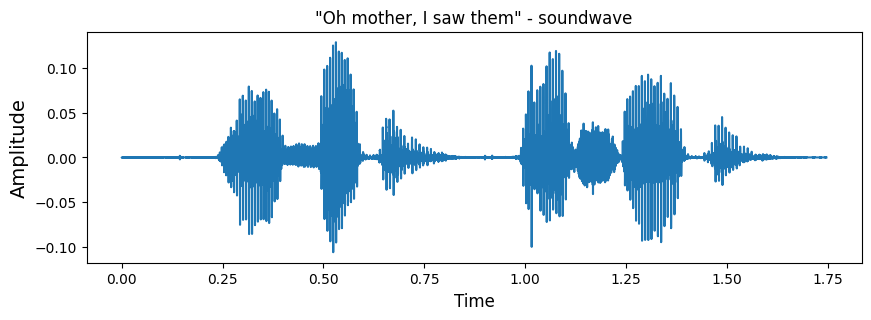

In [31]:
sample_rate = 16000
mother, sample_rate = sf.read('speech_utterance.wav')
time=np.linspace(0, len(mother)/sample_rate, len(mother))

normalised_mother=mother/np.max(np.abs(mother))

fig = plt.subplots(figsize=(10, 3))

plt.plot(time,mother)
plt.ylabel('Amplitude', fontsize=14)
plt.xlabel('Time', fontsize=12)
plt.title('"Oh mother, I saw them" - soundwave', fontsize=12)




## Ερώτημα 2.2

### Ενέργεια βραχέος χρόνου
---

Θέλουμε να υπολογίσουμε την Ενέργεια του Σήματος mother, συναρτήσει του χρόνου.

Η ενέργεια βραχέος χρόνου ορίζεται ως: $E[n] = \sum_{m=-\infty}^{\infty} |x[m]|^2 w[n - m]$  όπου w ένα παράθυρο της επιλογής μας. Εμείς επιλέγουμε το Hamming παράθυρο (συνάρτηση **hamming()** στη numpy). Για το πλάτος αυτού του παραθύρου επιλέγουμε τιμές: 20ms, 30ms, 40ms, 50ms. Η συνέλιξη δίνεται έτοιμη από την βιβλιοθήκη της numpy, με την εντολή **np.convolve()**.
Στο τέλος κανονικοποιήσαμε το σήμα ενέργειας και το εμφανίζουμε μαζί με το κανονικοποιημένο αρχικό σήμα.


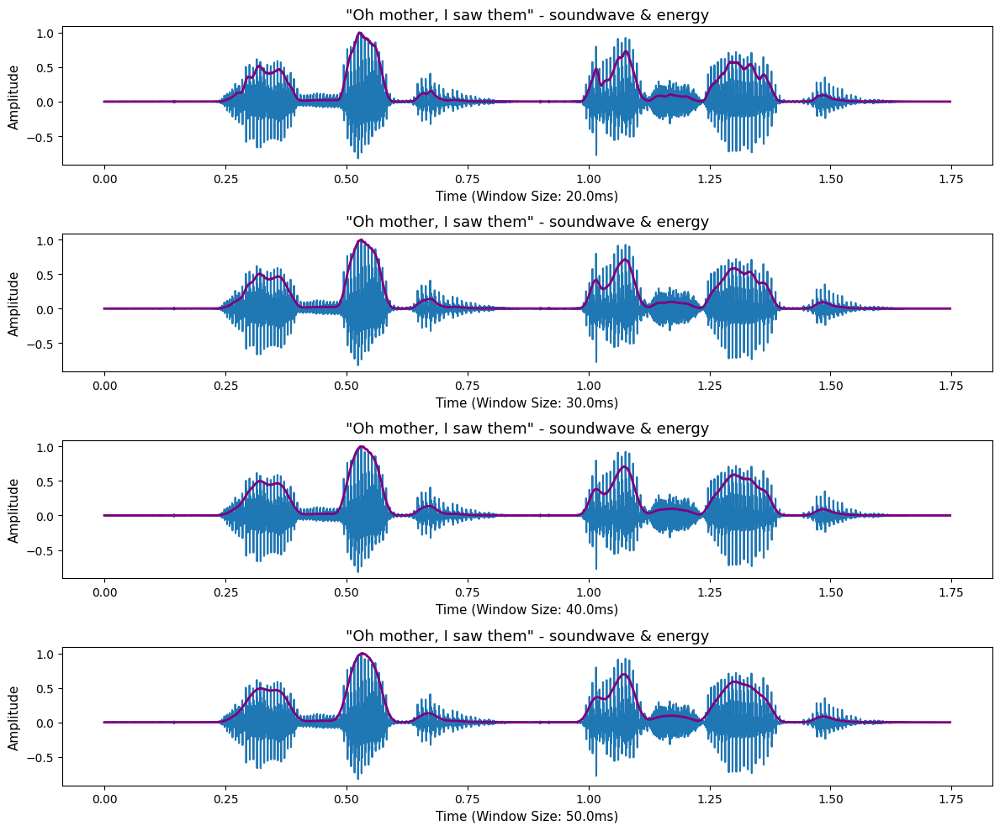

In [32]:
window_size = [0.02, 0.03, 0.04, 0.05]
mother_squared = mother*mother
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(12, 10))

for size in window_size:
  hamming = np.hamming(size*sample_rate) # Η δημιουργία του hamming παραθύρου
  energy = []

  energy = np.convolve(mother_squared, hamming, mode='same') # Η συνέλιξη
  normalised_energy = energy / np.max(abs(energy)) # Η κανονικοποίηση


  axs[window_size.index(size)].plot(time, normalised_mother)
  axs[window_size.index(size)].plot(time, normalised_energy, color="purple", linewidth=2)
  #Μορφοποιήσεις
  axs[window_size.index(size)].set_title('"Oh mother, I saw them" - soundwave & energy', fontsize=13)
  axs[window_size.index(size)].set_ylabel('Amplitude', fontsize=11)
  axs[window_size.index(size)].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()



Παρατηρούμε ότι όσο μεγαλύτερο είναι το παράθυρο hammimg, τόσο πιο ομαλό είναι το γράφημα της Ενέργειας. Αυτό είναι λογικό διότι απότομες αλλαγές του σήματος εισόδου, έχουν μικρότερο "βάρος" (άρα και αποτύπωση) στο γράφημα της ενέργειας, όταν έχουμε μεγαλύτερο παράθυρο. Στην δικιά μας εφαρμογή τα 20ms είναι ικανοποιητικά.


### Zero Crossing Rate
---

Θέλουμε να υπολογίσουμε το Zero Crossing Rate του Σήματος mother, συναρτήσει του χρόνου.

Το ZCR ορίζεται ως: $ZCR[n] = \sum_{m=-\infty}^{\infty} |sgn(x[m])-sgn(x[m-1])| * w[n - m]$  όπου w ένα παράθυρο της επιλογής μας. Εμείς επιλέγουμε το Rectangualar παράθυρο (συνάρτηση **rect()** στη numpy). Για το πλάτος αυτού του παραθύρου επιλέγουμε τιμές: 20ms, 30ms, 40ms, 50ms. Η συνέλιξη δίνεται έτοιμη από την βιβλιοθήκη της numpy, με την εντολή **np.convolve()**.
Στο τέλος κανονικοποιήσαμε το σήμα ZCR και το εμφανίζουμε μαζί με το κανονικοποιημένο αρχικό σήμα.



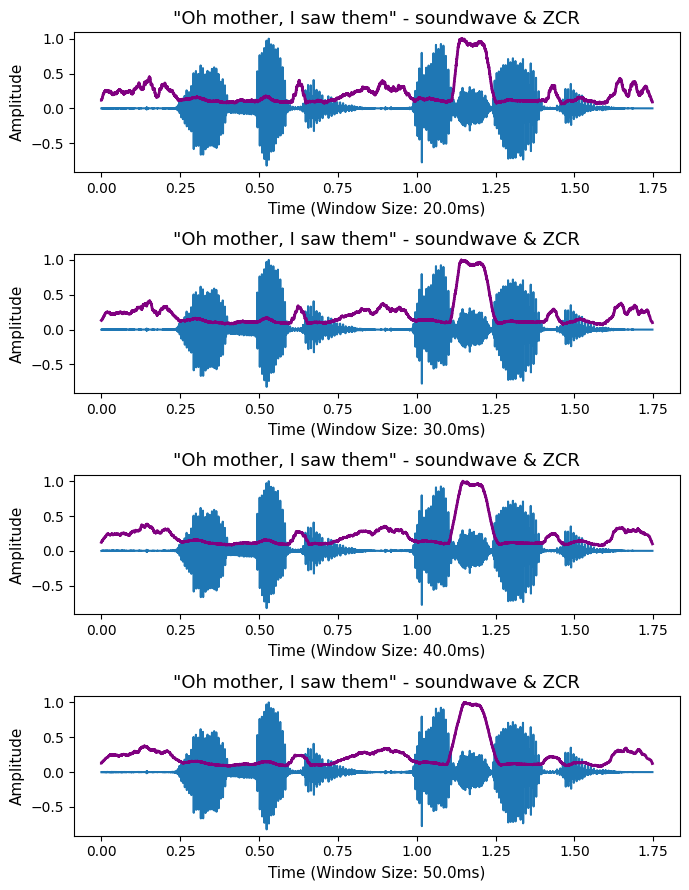

In [33]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(7,9))

for size in window_size:
  i = window_size.index(size)
  rect = np.full(int(size*sample_rate), 1/(2*size*sample_rate)) # Rect Παράθυρο
  zcr = []
  mother_sign = []
  prev = 0

  for m in mother:
    mother_sign.append(np.abs(np.sign(m) - np.sign(prev)))
    prev = m

  zcr = np.convolve(mother_sign, rect, mode='same') # Συνέλιξη
  zcr_normalised = zcr / np.max(abs(zcr)) # Κανονικοποιήση

  #Μορφοποιήσεις
  axs[i].plot(time, normalised_mother)
  axs[i].plot(time, zcr_normalised, color="purple", linewidth=2)
  axs[i].set_title('"Oh mother, I saw them" - soundwave & ZCR', fontsize=13)
  axs[i].set_ylabel('Amplitude', fontsize=11)
  axs[i].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()


Πάλι βλέπουμε πως όσο μεγαλύτερο είναι το παράθυρο rect, τόσο πιο ομαλό είναι το γράφημα της Ενέργειας.

Μπορούμε να χρησιμοποιήσουμε την Ενέργεια και το ZCR, για να κατανοήσουμε το αρχικό σήμα. Συγκεκριμένα, με την ενέργεια μπορούμε να εντοπίσουμε τα σημεία ήχου και αφωνίας. Όταν η ενέργεια είναι κοντά στο 0 έχουμε σιγή, ενώ όταν η ενέργεια είναι υψηλή, έχουμε ομιλία. Το ZCR μπορεί να χρησιμοποιηθεί για να ξεχωρίσουμε τους έμφωνους από τους άφωνους ήχους. Συγκεκριμένα, οι έμφωνοι ήχοι (π.χ. /aa/, /ih/) έχουν χαμηλό ZCR, επειδή η φωνητική δόνηση δημιουργεί ομαλές, περιοδικές κυματομορφές με λίγες διασταυρώσεις από το μηδέν. Αντίθετα, οι άφωνοι ήχοι (π.χ. /f/, /p/, /s/) εμφανίζουν υψηλό ZCR, καθώς αποτελούνται από θορυβώδεις ή απότομες μεταβολές, που οδηγούν σε συχνές μηδενικές διασταυρώσεις. Στα 1.1 sec, η μεγάλη αύξηση του ZCR οφείλεται στην λέξη saw, και τον άφωνο ήχο /s/.

## Ερώτημα 2.3

###  Μετασχηματισμός Fourier βραχέος χρόνου
---

Υπολογίζουμε τον μετασχηματισμό Fourier βραχέος χρόνου για τα 4 μήκη παραθύρου με τη βοήθεια της εντολής stft(). Αποθυκεύουμε τα στοιχεία κάθε μετασχηματισμού, για την μελοντική τους χρήση χωρίς νέους υπολογισμούς.

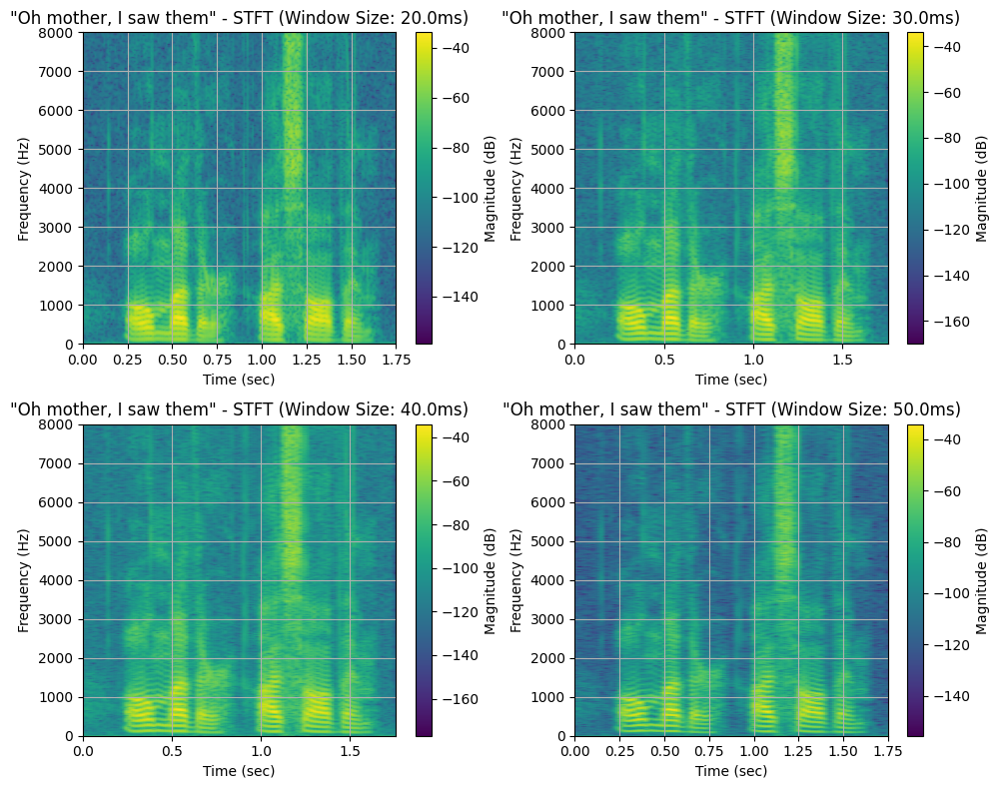

In [34]:
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))
f = []
t = []
Zxx = []

for size in window_size:
  i = window_size.index(size)
  #Creation and Plotting of STFT
  f1, t1, Zxx1 = stft(mother, sample_rate, nperseg=sample_rate*size, nfft=2048) # The stft of the signal
  f.append(f1) # Αποθυκεύουμε τον πίνακα συχνοτήτων
  t.append(t1) # Αποθυκεύουμε τον πίνακα χρόνου
  Zxx.append(Zxx1) # Αποθυκεύουμε τον πίνακα πλάτους

  mesh = axs[i//2][i%2].pcolormesh(t1,f1, 20*np.log10(np.abs(Zxx1 + 0.00000001)), shading='gouraud') # πλοτινγκ

  # Μορφοποιήσεις
  cbar = fig.colorbar(mesh, ax=axs[i//2][i%2])
  cbar.set_label('Magnitude (dB)')
  axs[i//2][i%2].set_title(f'"Oh mother, I saw them" - STFT (Window Size: {size*1000}ms)', fontsize=12)
  axs[i//2][i%2].set_ylabel('Frequency (Hz)', fontsize=10)
  axs[i//2][i%2].set_xlabel('Time (sec)', fontsize=10)
  axs[i//2][i%2].grid()
  plt.subplots_adjust(hspace=0.5)
  plt.subplots_adjust(wspace=0.2)
  plt.tight_layout()

Το spectrogram δείχνει πώς αλλάζει το περιεχόμενο συχνοτήτων ενός σήματος με το χρόνο. Όταν εφαρμόζουμε τον STFT, διαιρούμε το σήμα σε μικρά κομμάτια (παράθυρα) και για κάθε ένα υπολογίζουμε ποιες συχνότητες υπάρχουν. Αν χρησιμοποιήσουμε ένα μεγαλύτερο παράθυρο, π.χ. 50 ms, τότε μέσα σε αυτό το μεγαλύτερο κομμάτι του χρόνου έχουμε περισσότερα δεδομένα, οπότε μπορούμε να ξεχωρίσουμε καλύτερα τις συχνότητες. Ωστόσο, το μειονέκτημα είναι ότι χάνουμε λίγο την ακρίβεια στο πότε ακριβώς συμβαίνουν οι αλλαγές, γιατί το παράθυρο καλύπτει μεγαλύτερο χρονικό διάστημα. Αντίστροφα, με ένα μικρότερο παράθυρο, π.χ. 20 ms, καταγράφουμε πιο λεπτομερώς τις γρήγορες αλλαγές στο χρόνο, αλλά δεν μπορούμε να διακρίνουμε τόσο καλά κοντινές συχνότητες.

###  Φασματικό κέντρο
---

Το φασματικό κέντρο ορίζεται ως η μέση συχνότητα ενός σήματος σε ένα χρονικό παράθυρο. Για να βρούμε το φασματικό κέντρο, χρησιμοποιούμε την συνάρτηση: ***np.sum(f * np.abs(z).T, axis = 1) / np.sum(np.abs(z).T, axis = 1)*** . Συγκεκριμένα, για κάθε χρονικό πλαίσιο, πολλαπλασιάζει τις συχνότητες (f) με το απόλυτο μέτρο του φάσματος (z), αθροίζει αυτές τις τιμές και τις διαιρεί με το συνολικό άθροισμα των τιμών του φάσματος (δηλαδή, την ολική ενέργεια). Το αποτέλεσμα είναι ο σταθμισμένος μέσος όρος των συχνοτήτων, που αντιπροσωπεύει το "κέντρο βάρους" του φάσματος για κάθε πλαίσιο.



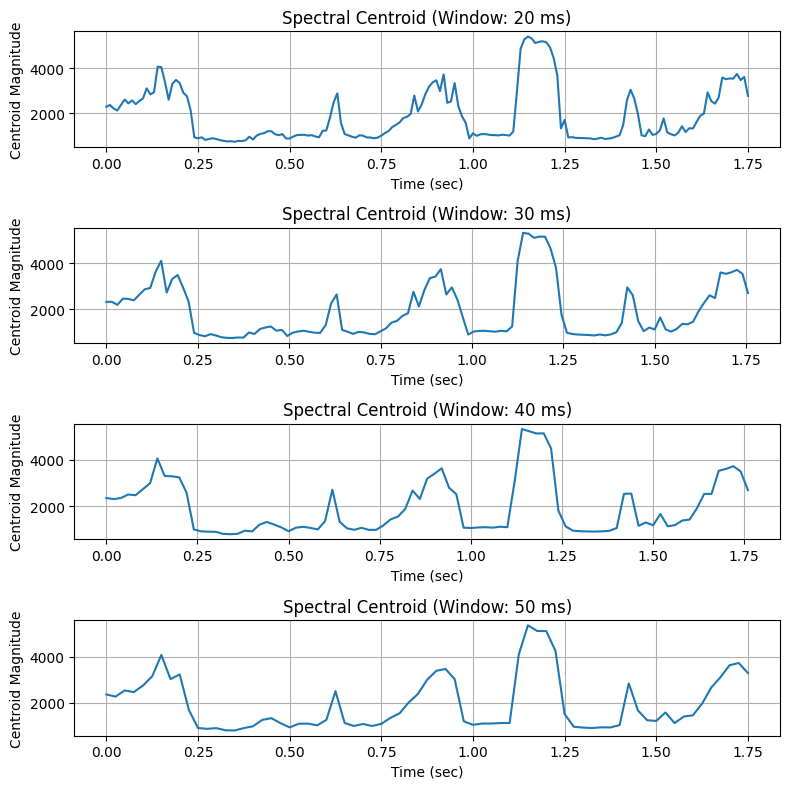

In [35]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(8, 8))

# Υπολογίζουμε το spectral centroid
def spectral_centroid(z, f):
    return np.sum(f * np.abs(z).T, axis = 1) / np.sum(np.abs(z).T, axis = 1)

spec_cent = []

for size in window_size:
    i = window_size.index(size)
    spec_cent.append(spectral_centroid(Zxx[i], f[i]))
    axs[i].plot(t[i], spec_cent[i])
    # Μορφοποιήσεις
    axs[i].set_title(f'Spectral Centroid (Window: {size*1000:.0f} ms)', fontsize = 12)
    axs[i].set_ylabel('Centroid Magnitude', fontsize=10)
    axs[i].set_xlabel('Time (sec)', fontsize=10)
    axs[i].grid()
    plt.subplots_adjust(hspace=0.5)
    plt.tight_layout()



Όσο μεγαλύτερο είναι το παράθυρο του STFT, τόσο καλύτερα διακρίνουμε τις συχνότητες και το spectral centroid είναι πιο ακριβές. Αν όμως το παράθυρο είναι μικρό, έχουμε καλύτερη χρονική ανάλυση, αλλά οι συχνότητες δεν ξεχωρίζουν τόσο καλά, κάνοντας το spectral centroid λιγότερο σταθερό.










### Φασματικό κέντρο και Spectograph
---

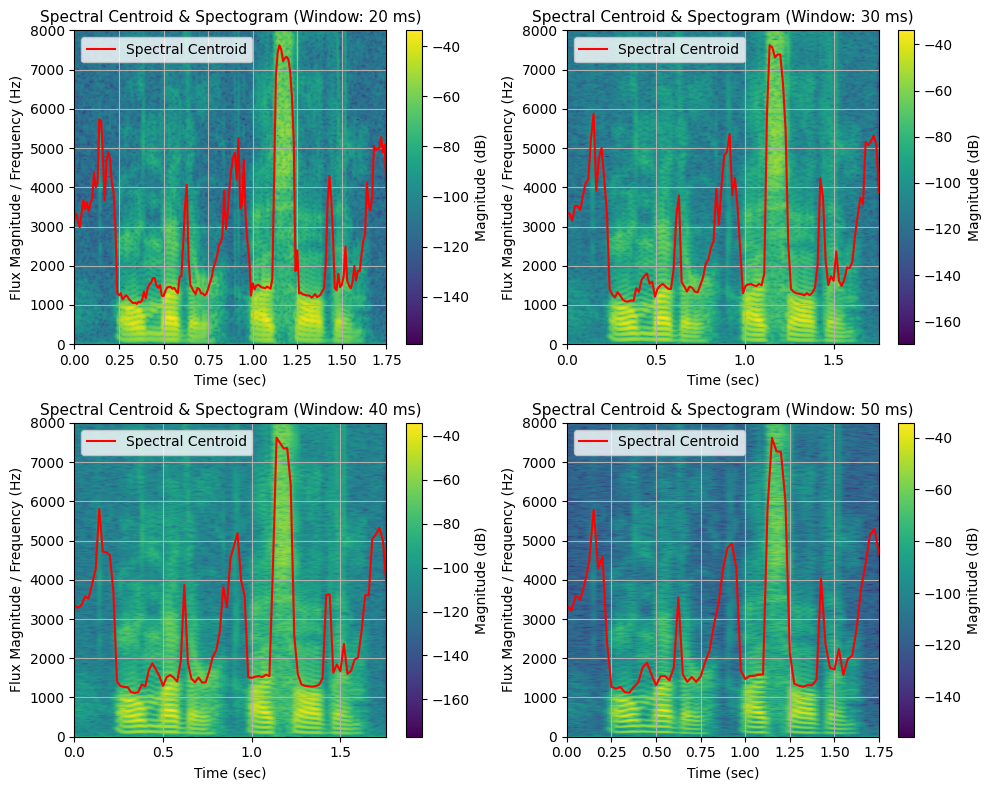

In [36]:
#ΦΑΣΜΑΤΙΚΟ CENTROID ME SPECTOGRAM
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  # Δημιουργία Spectograph
  mesh = axs[i//2][i%2].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i//2][i%2])
  cbar.set_label('Magnitude (dB)')

  # Spectral Centroid Οπτικοποίηση
  norm_centroid = spec_cent[i] / (1.05*np.max(spec_cent[i]))  # Κανονικοποίηση
  axs[i//2][i%2].plot(t[i], 8000*norm_centroid, color='r', label='Spectral Centroid')

  # Μορφοποίηση
  axs[i//2][i%2].set_title(f'Spectral Centroid & Spectogram (Window: {size*1000:.0f} ms)', fontsize=11)
  axs[i//2][i%2].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i//2][i%2].set_xlabel('Time (sec)', fontsize=10)
  axs[i//2][i%2].grid()
  axs[i//2][i%2].legend()
  plt.subplots_adjust(hspace=0.5)
  plt.tight_layout()

Το spectral centroid δείχνει την κεντρική συχνότητα ενός ήχου, δηλαδή το σημείο όπου συγκεντρώνεται το "βάρος" της ενέργειας στο φάσμα του. Με άλλα λόγια, είναι ο σταθμισμένος μέσος όρος των συχνοτήτων, όπου το πλάτος κάθε συχνότητας λειτουργεί ως βάρος. Μια υψηλή τιμή του spectral centroid υποδηλώνει ότι το φάσμα έχει περισσότερη ενέργεια στις υψηλές συχνότητες, δίνοντας μια πιο "φωτεινή" ή "ακουστική" εντύπωση, ενώ μια χαμηλότερη τιμή δείχνει ότι κυριαρχούν οι χαμηλές συχνότητες, δίνοντας έναν πιο "ζεστό" ή "βαθύ" ήχο.

Με αυτές τις γνώσεις, παρατηρούμε ότι περιοχές που
σε υψηλές συχνότητες έχουν υψηλές τιμές db, έχουν και υψηλή τιμή φασματικού κέντρου (1.1sec). Αντίστοιχα περιοχές που έχουν περιορισμένο κέρδος db μόνο σε χαμηλές συχνότητες, έχουν και χαμηλό φασματικό κέντρο (0.3sec).

###  Φασματική Ροή
---

Η φασματική ροή είναι ένα μαγικό πράγμα το οποίο δεν εξηγείται με λέξεις αλλά μόνο με συναισθήματα. Επισης ειναι το μέτρο που δείχνει πόσο αλλάζει το φάσμα ενός σήματος από ένα χρονικό πλαίσιο στο επόμενο. Εμείς θα υπολογίσουμε την φασματική ροή με τις παρακάτω εξισώσεις:

- ***power_spec = np.abs(Zxx[i]) ** 2***


- ***flux.append(np.linalg.norm(power_spec[:, 1:] - power_spec[:, :-1], axis=0))***

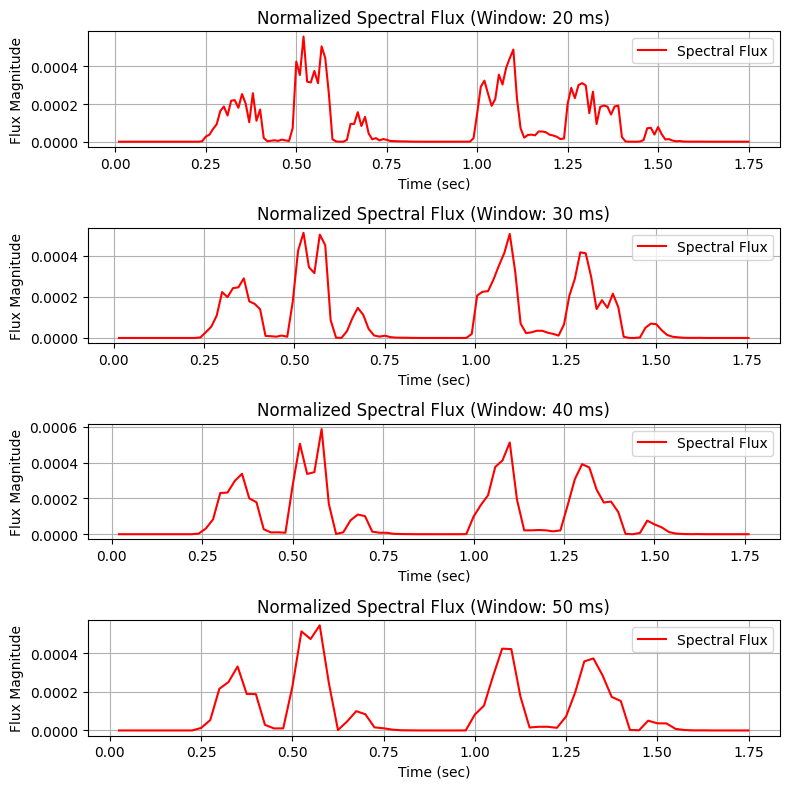

In [37]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ΜΟΝΗ ΤΗΣ
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(8, 8))

flux = []

for size in window_size:
  # Indexing
  i = window_size.index(size)
  # Υπολογισμός φασματικής ροής
  power_spec = np.abs(Zxx[i]) ** 2  # Υπολογισμός φασματικής ενέργειας
  flux.append(np.linalg.norm(power_spec[:, 1:] - power_spec[:, :-1], axis=0))  # Ευκλείδεια απόσταση

  # Spectral Flux Οπτικοποίηση
  axs[i].plot(t[i][1:], flux[i], color='r', label='Spectral Flux')

  # Μορφοποιήσεις
  axs[i].set_title(f'Normalized Spectral Flux (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()



Μπορούμε πάλι να βγάλουμε τα ίδια συμπεράσματα για το μέγεθος του παραθύρου και την επίδραση στην φασματική ροή.

### Φασματική Ροή και Spectograph
---

<ipython-input-38-4c55a027eb2d>:23: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


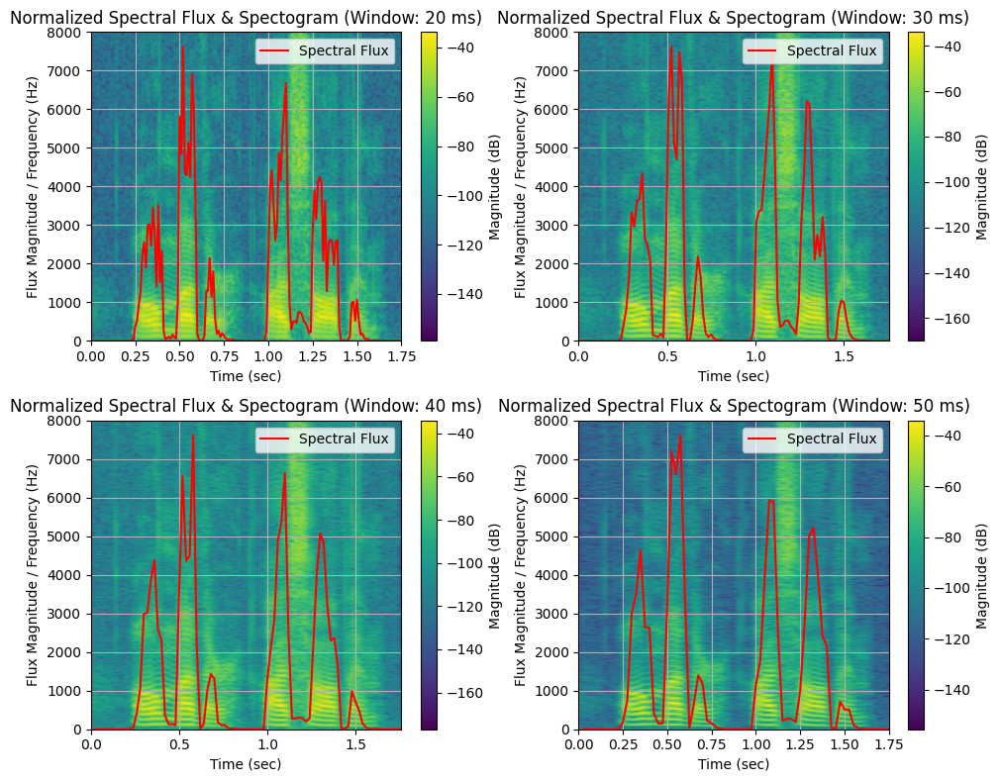

In [38]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ME SPECTOGRAM
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  # Δημιουργία Spectograph
  mesh = axs[i//2][i%2].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i//2][i%2])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_flux = flux[i] / (1.05*np.max(flux[i]))  # Κανονικοποίηση
  axs[i//2][i%2].plot(t[i][1:], 8000*norm_flux, color='r', label='Spectral Flux')
  axs[i//2][i%2].set_title(f'Normalized Spectral Flux & Spectogram (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i//2][i%2].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i//2][i%2].set_xlabel('Time (sec)', fontsize=10)
  axs[i//2][i%2].grid()
  axs[i//2][i%2].legend()
  plt.subplots_adjust(hspace=0.5)
  plt.subplots_adjust(wspace=0.2)
  plt.tight_layout()

Η φασματική ροή είναι ένα μέτρο που περιγράφει την αλλαγή στο φάσμα ενός ήχου σε σχέση με τον χρόνο. Συγκεκριμένα, μετράει την ποσότητα της διαφοράς μεταξύ δύο διαδοχικών φασματικών παραθύρων, αναδεικνύοντας την ταχύτητα με την οποία το φάσμα μεταβάλλεται. Όσο μεγαλύτερη είναι η αλλαγή στο φάσμα από το ένα παράθυρο στο άλλο, τόσο μεγαλύτερη είναι η τιμή της φασματικής ροής.

Στα παραπάνω γραφήματα παρατηρούμε πως όταν έχουμε μια σταθερή εικόνα του φάσματος για ένα χρονικό παράθυρο (0.8sec - 1sec), τότε και η φασματική ροή είναι χαμηλή. Αντίθετα όταν σε ένα χρονικό παράθυρο έχουμε έντονη μεταβολή του φάσματος (0.25sec - 0.4sec), τότε και η μαγνητική ροή είναι υψηλή.






## Ερώτημα 2.4

###  Μετασχηματισμός Fourier βραχέος χρόνου για το Μουσικό Σήμα
---

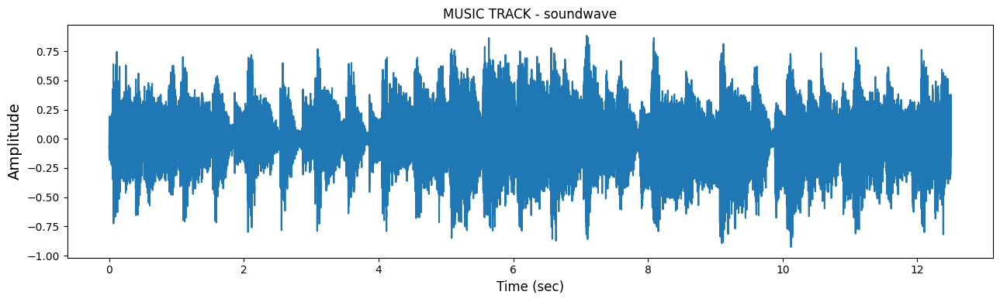

In [39]:
sample_rate = 48000 # Νέο sample rate
music, sample_rate = sf.read('music.wav') # Εισαγωγή σήματος
time = np.linspace(0, len(music)/sample_rate, len(music))

normalised_music = music/np.max(np.abs(music)) # Κανονικοποίηση

fig = plt.subplots(figsize=(13, 4))

# Μορφοποίηση
plt.plot(time,music)
plt.ylabel('Amplitude', fontsize=14)
plt.xlabel('Time (sec)', fontsize=12)
plt.title('MUSIC TRACK - soundwave', fontsize=12)
plt.tight_layout()

### Ενέργεια βραχέος χρόνου Μουσικού Σήματος
---
Χρησιμοποιούμε πάλι 4 χρονικά παράθυρα. Η διαδικασία είναι η ίδια με το προηγούμενο σήμα.

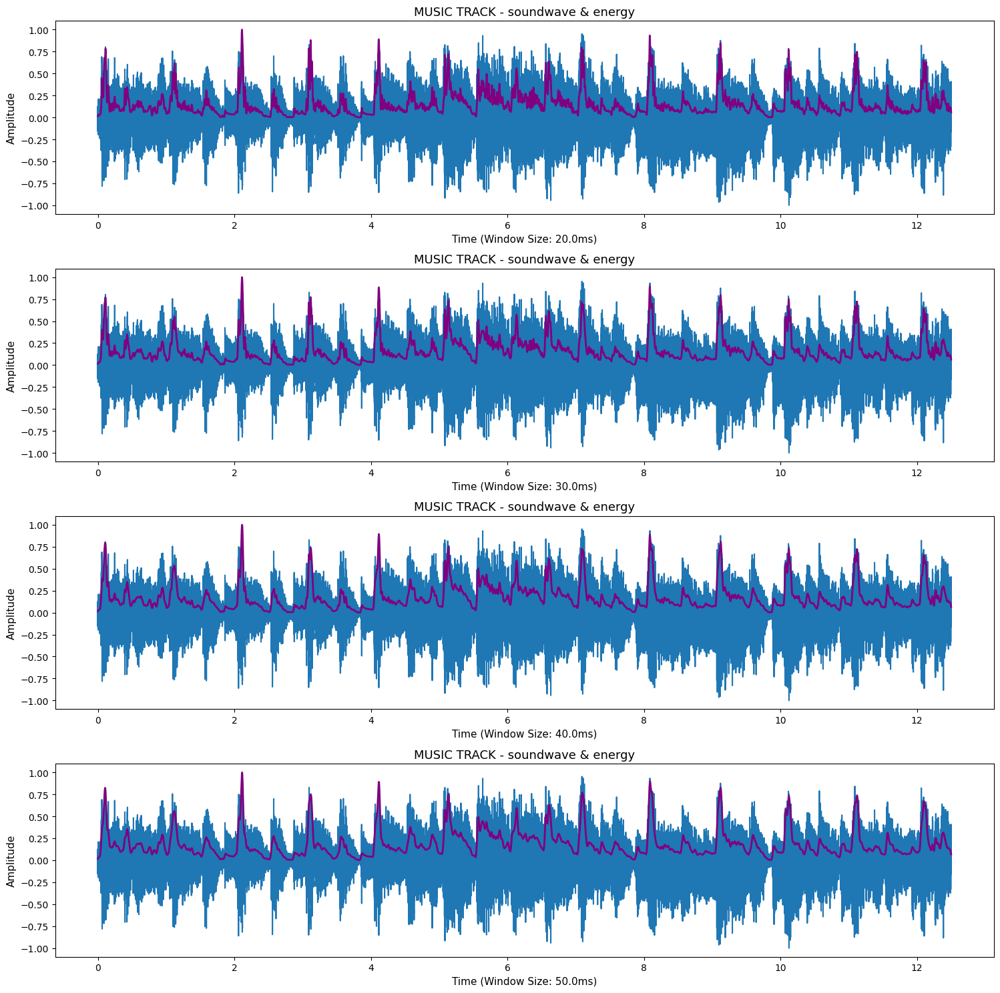

In [40]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(15, 15))
window_size = [0.02, 0.03, 0.04, 0.05]
music_squared = music*music # Τετραγωνισμός μουσικού σήματος

for size in window_size:
  hamming = np.hamming(size*sample_rate)
  energy = []

  energy = np.convolve(music_squared, hamming, mode='same') # Συνέλιξη με το παράθυρο hamming
  normalised_energy = energy / np.max(abs(energy)) # Κανονικοποίηση της ενέργειας

  axs[window_size.index(size)].plot(time, normalised_music)

  # Μορφοποίηση
  axs[window_size.index(size)].set_title('MUSIC TRACK - soundwave & energy', fontsize=13)
  axs[window_size.index(size)].plot(time, normalised_energy, color="purple", linewidth=2)
  axs[window_size.index(size)].set_ylabel('Amplitude', fontsize=11)
  axs[window_size.index(size)].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()



Εδώ βλέπουμε πως η ενέργεια δεν είναι ποτέ μηδενική, πράγμα που είναι λογικό καθώς ποτέ δεν σταματαέι να ακούγεται μουσική. Ακόμη, η ενέργεια φαίνεται να ακολουθάει την περιβάλουσα του σήματος της μουσικής, ειδικά στο παράθυρο των 20ms.

### Zero Crossing Rate Μουσικού Σήματος
---


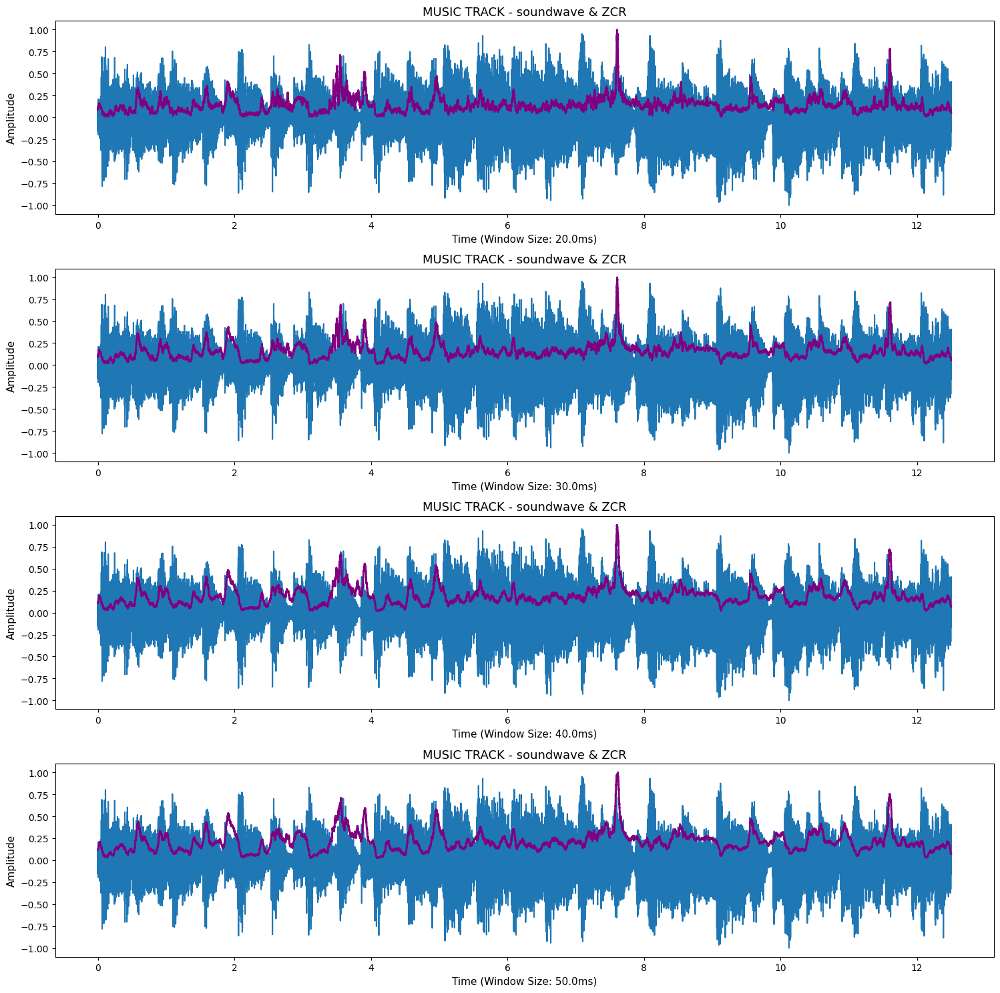

In [41]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(15, 15))

for size in window_size:
  i = window_size.index(size)
  rect = np.full(int(size*sample_rate), 1/(2*size*sample_rate))
  zcr = []
  music_sign = []
  prev = 0

  for m in music:
    music_sign.append(np.abs(np.sign(m) - np.sign(prev)))
    prev = m

  zcr = np.convolve(music_sign, rect, mode='same') # Συνέλιξη
  zcr_normalised = zcr / np.max(abs(zcr)) # Κανονικοποίηση ZCR
  axs[i].plot(time, normalised_music)

  # Μορφοποίηση
  axs[i].set_title('MUSIC TRACK - soundwave & ZCR', fontsize=13)
  axs[i].plot(time, zcr_normalised, color="purple", linewidth=2)
  axs[i].set_ylabel('Amplitude', fontsize=11)
  axs[i].set_xlabel(f'Time (Window Size: {size*1000}ms)', fontsize=11)
  plt.subplots_adjust(hspace=0.6)
  plt.tight_layout()

###  Μετασχηματισμός Fourier βραχέος χρόνου Μουσικού Σήματος
---

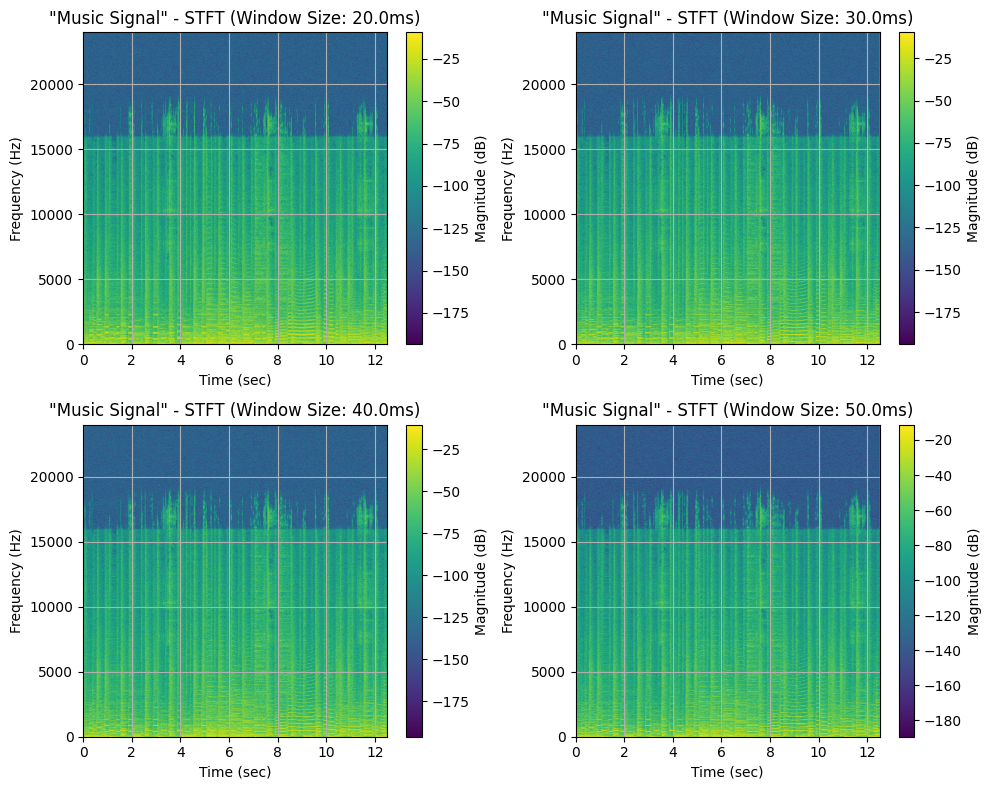

In [42]:
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))
f = []
t = []
Zxx = []

for size in window_size:
  i = window_size.index(size)
  #Creation and Plotting of STFT
  f1, t1, Zxx1 = stft(music, sample_rate, nperseg=sample_rate*size, nfft=4024) # Ebala 4024 nfft
  f.append(f1)
  t.append(t1)
  Zxx.append(Zxx1)
  mesh = axs[i//2][i%2].pcolormesh(t1,f1, 20*np.log10(np.abs(Zxx1 + 0.00000001)), shading='gouraud')

  #visualisation settings
  cbar = fig.colorbar(mesh, ax=axs[i//2][i%2])
  cbar.set_label('Magnitude (dB)')  # Set the label for the colorbar
  axs[i//2][i%2].set_title(f'"Music Signal" - STFT (Window Size: {size*1000}ms)', fontsize=12)
  axs[i//2][i%2].set_ylabel('Frequency (Hz)', fontsize=10)
  axs[i//2][i%2].set_xlabel('Time (sec)', fontsize=10)
  axs[i//2][i%2].grid()
  plt.subplots_adjust(hspace=0.5)
  fig.tight_layout()

Παρατηρούμε ότι το σήμα έχει υψηλά dB σε ένα ευρύ φάσμα συχνοτήτων, με την μεγαλύτερη συγκέντρωση να βρίσκεται στις μεσαίες και χαμηλές συχνότητες. Βλέπουμε επίσης περιοδικές γραμμές που ανεβαίνουν και κατεβαίνουν στο φάσμα, πιθανώς υποδηλώνοντας επαναλαμβανόμενα μοτίβα ή ρυθμικές μεταβολές στο μουσικό κομμάτι. Οι υψηλές συχνότητες έχουν χαμηλές τιμές dB, πράγμα που δείχνει ότι το σήμα δεν περιλαμβάνει ήχους πάνω απο 16kHz. Οι υψυλότερες τιμές dB, παρατηρούνται για συχνότητες κοντά στο 0, πράγμα λογικό, καθώς στο εύρος 0 - 1000Hz βρίσκονται τα μπάσα και το midrange.

###  Φασματικό κέντρο του Μουσικού Σήματος
---

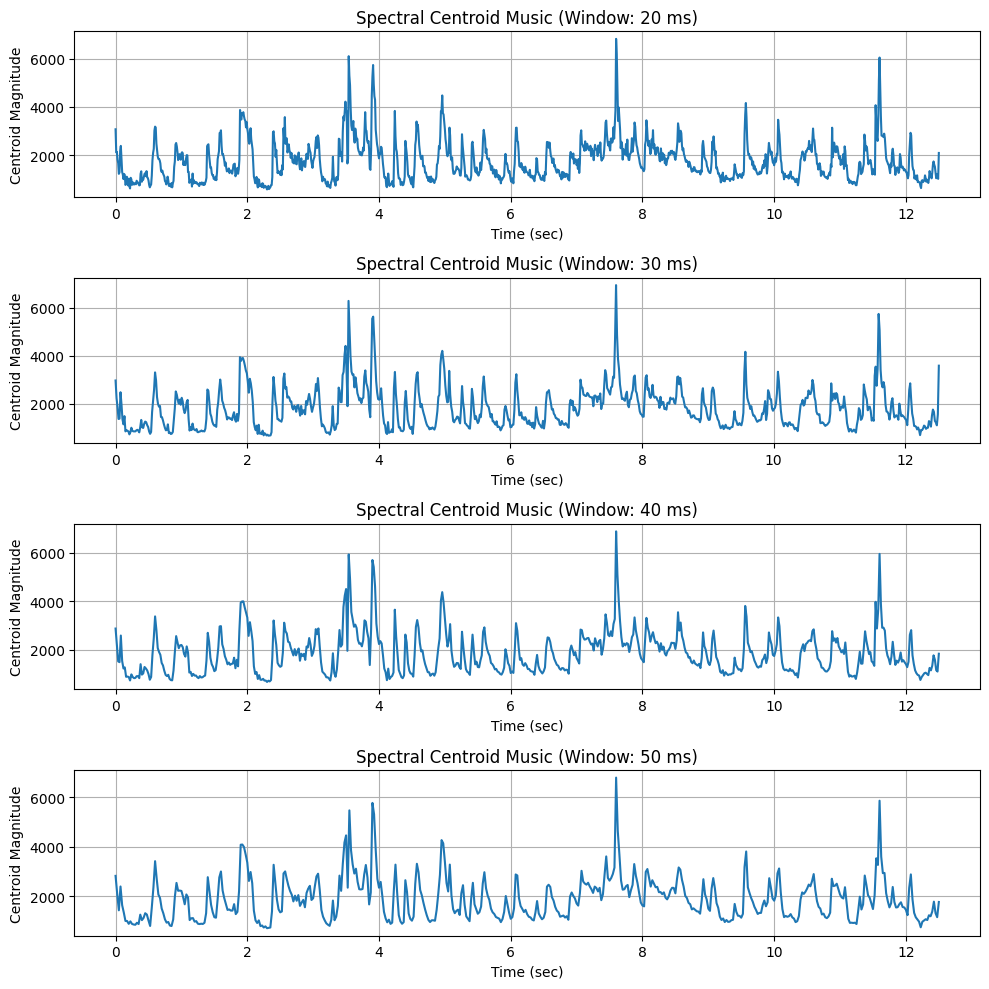

In [43]:
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(10, 10))

def spectral_centroid(z, f):
    return np.sum(f * np.abs(z).T, axis = 1) / np.sum(np.abs(z).T, axis = 1)
# Συνάρτηση Φασματικού Κέντρου

spec_cent = []

for size in window_size:
    i = window_size.index(size)

    spec_cent.append(spectral_centroid(Zxx[i], f[i])) # Υπολογισμός Φασματικού Κέντρου
    axs[i].plot(t[i], spec_cent[i])

    # Μορφοποίηση
    axs[i].set_title(f'Spectral Centroid Music (Window: {size*1000:.0f} ms)', fontsize = 12)
    axs[i].set_ylabel('Centroid Magnitude', fontsize=10)
    axs[i].set_xlabel('Time (sec)', fontsize=10)
    axs[i].grid()
    plt.subplots_adjust(hspace=0.5)
    fig.tight_layout()

### Φασματικό κέντρο και Spectograph Μουσικού Σήματος
---

<ipython-input-44-c7bb953ef456>:24: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()


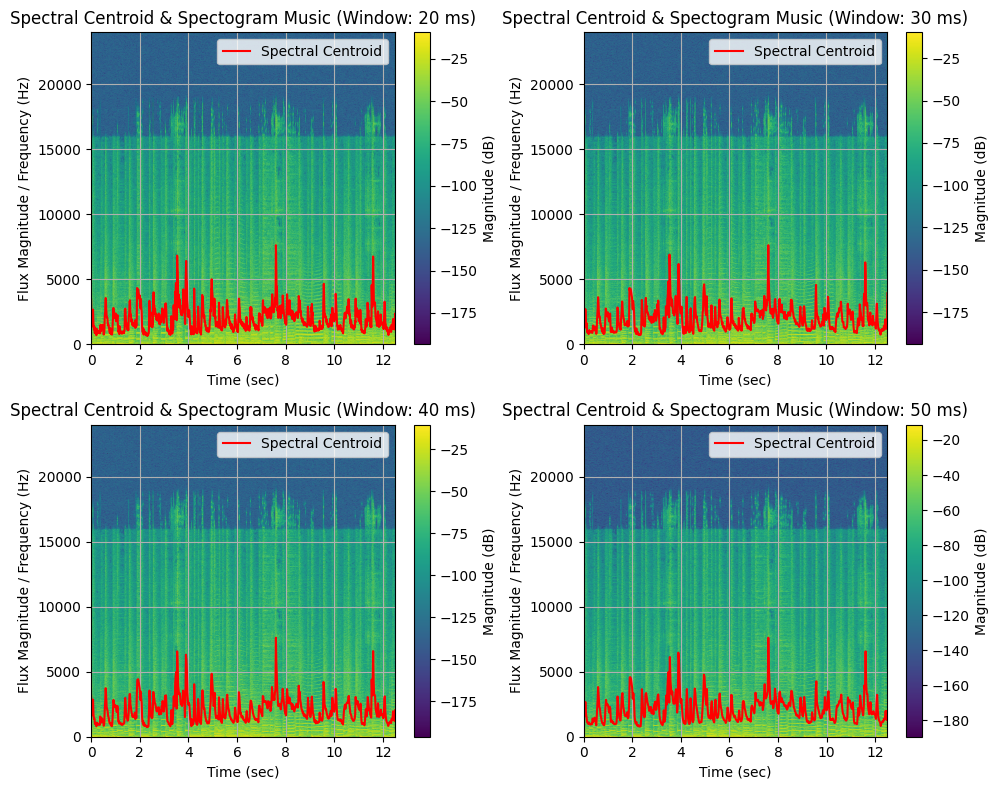

In [44]:
#ΦΑΣΜΑΤΙΚΟ CENTROID ME SPECTOGRAM
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  # Spectograph
  mesh = axs[i//2][i%2].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax = axs[i//2][i%2])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_centroid = spec_cent[i] / (1.05*np.max(spec_cent[i]))  # Κανονικοποίηση
  axs[i//2][i%2].plot(t[i], 8000*norm_centroid, color='r', label='Spectral Centroid')

  # Μορφοποίηση
  axs[i//2][i%2].set_title(f'Spectral Centroid & Spectogram Music (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i//2][i%2].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i//2][i%2].set_xlabel('Time (sec)', fontsize=10)
  axs[i//2][i%2].grid()
  axs[i//2][i%2].legend()
  plt.subplots_adjust(hspace=0.5)
  fig.tight_layout()


Το φασματικό κέντρο μας δείχνει ότι έχουμε ένα φάσμα ήχου που έχει μια μέση τιμή γύρω στα 2.5kHz. Αυτό επιβεβαιώνει την παρατήρηση μας ότι ο μεγαλύτερος όγκος των συχνοτήτων του μουσικού σήματος, βρίσκεται στις πολύ χαμηλές συχνότητες.

###  Φασματική Ροή Μουσικού Σήματος
---

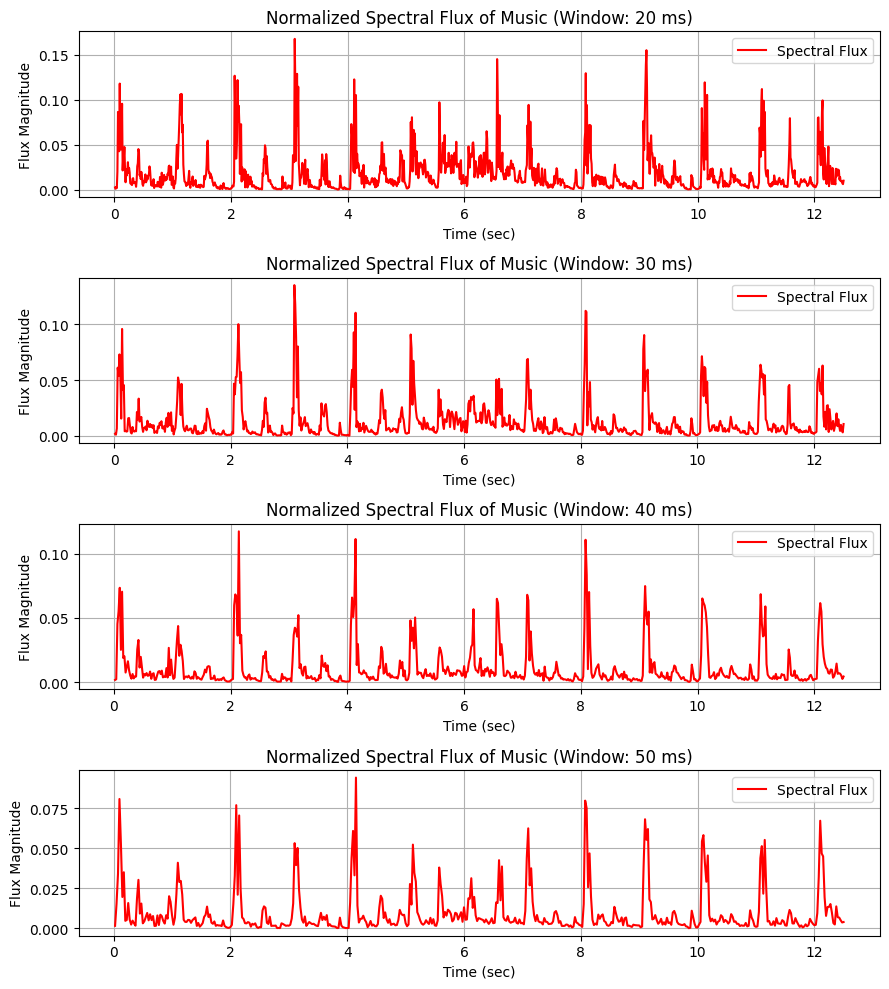

In [45]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ΜΟΝΗ ΤΗΣ
fig,axs = plt.subplots(nrows=4, ncols=1, figsize=(9, 10))

flux = []

for size in window_size:
  # Indexing
  i = window_size.index(size)

  # Υπολογισμός φασματικής ροής
  power_spec = np.abs(Zxx[i]) ** 2  # Υπολογισμός φασματικής ενέργειας
  flux.append(np.linalg.norm(power_spec[:, 1:] - power_spec[:, :-1], axis=0))  # Ευκλείδεια απόσταση

  # Spectral Flux Οπτικοποίηση
  axs[i].plot(t[i][1:], flux[i], color='r', label='Spectral Flux')

  # Μορφοποίηση
  axs[i].set_title(f'Normalized Spectral Flux of Music (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i].set_ylabel('Flux Magnitude', fontsize=10)
  axs[i].set_xlabel('Time (sec)', fontsize=10)
  axs[i].grid()
  axs[i].legend()
  plt.subplots_adjust(hspace=0.6)
  fig.tight_layout()

### Φασματική Ροή και Spectograph Μουσικού Σήματος
---


<ipython-input-46-29838edbd343>:23: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()


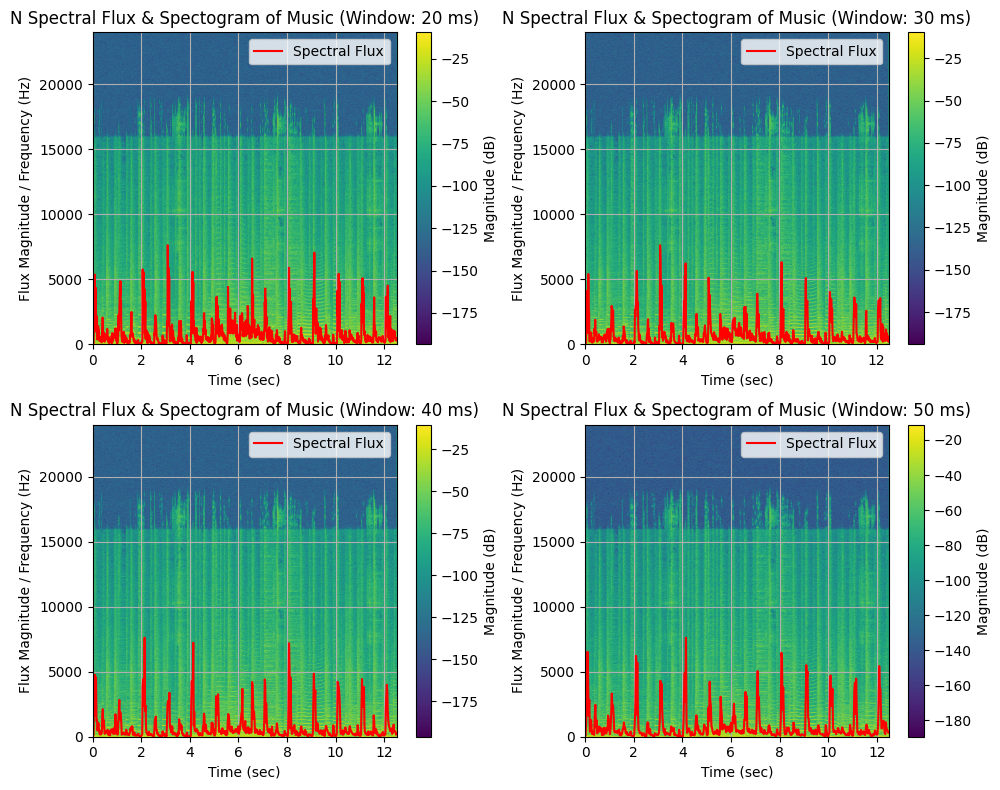

In [46]:
#ΦΑΣΜΑΤΙΚΗ ΡΟΗ/FLUX ME SPECTOGRAM
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

for size in window_size:
  # Indexing
  i = window_size.index(size)

  mesh = axs[i//2][i%2].pcolormesh(t[i], f[i], 20*np.log10(np.abs(Zxx[i] + 0.00000001)), shading='gouraud')
  cbar = fig.colorbar(mesh, ax=axs[i//2][i%2])
  cbar.set_label('Magnitude (dB)')

  # Spectral Flux Οπτικοποίηση
  norm_flux = flux[i] / (1.05*np.max(flux[i]))  # Κανονικοποίηση
  axs[i//2][i%2].plot(t[i][1:], 8000*norm_flux, color='r', label='Spectral Flux')

  # Μορφοποίηση
  axs[i//2][i%2].set_title(f'N Spectral Flux & Spectogram of Music (Window: {size*1000:.0f} ms)', fontsize=12)
  axs[i//2][i%2].set_ylabel('Flux Magnitude / Frequency (Hz)', fontsize=10)
  axs[i//2][i%2].set_xlabel('Time (sec)', fontsize=10)
  axs[i//2][i%2].grid()
  axs[i//2][i%2].legend()
  plt.subplots_adjust(hspace=0.5)
  fig.tight_layout()

Από την φασματική ροή, μπρορούμε να καταλάβουμε την επαναληπτικότητα του μουσικού σήματος. Βλέπουμε πως η ροή ακολουθά μια περιοδική συμπεριφορά. Η μουσική λοιπόν, έχει ένα σταθερό τέμπο και ακολουθεί ένα ηχητικό μοτίβο, μεταξύ πυκνών και αραιών φασματικά περιοχών.

# **Μέρος 3ο - Ψηφιακή Επεξεργασία και Φασματική Ανάλυση Βιοσημάτων Κητωδών**




## Ερώτημα 3.1
---
Φορτώνουμε τα δύο σήματα με τη χρήση της εντολής librosa.load() της βιβλιοθήκης librosa και αποθηκεύουμε τα raw βιοσήματα και το sampling-rate τους.

Τα σήματα αυτά είναι σήματα τάσης και τα μετατρέπουμε σε σήματα πίεσης αξιοποιώντας τη δοσμένη εξίσωση
$$
\text{pressure} = \frac{1.5 \cdot y \cdot GF}{10^{\frac{\text{sensitivity}}{20}}}
$$


Φτιάχνουμε μια συνάρτηση pressure() για τη μετατροπή αυτή.

Πλοτάρουμε το κάθε σήμα πίεσης που προκύπτει σε σχέση με τον χρόνο (τα δείγματα του κάθε σήματος).





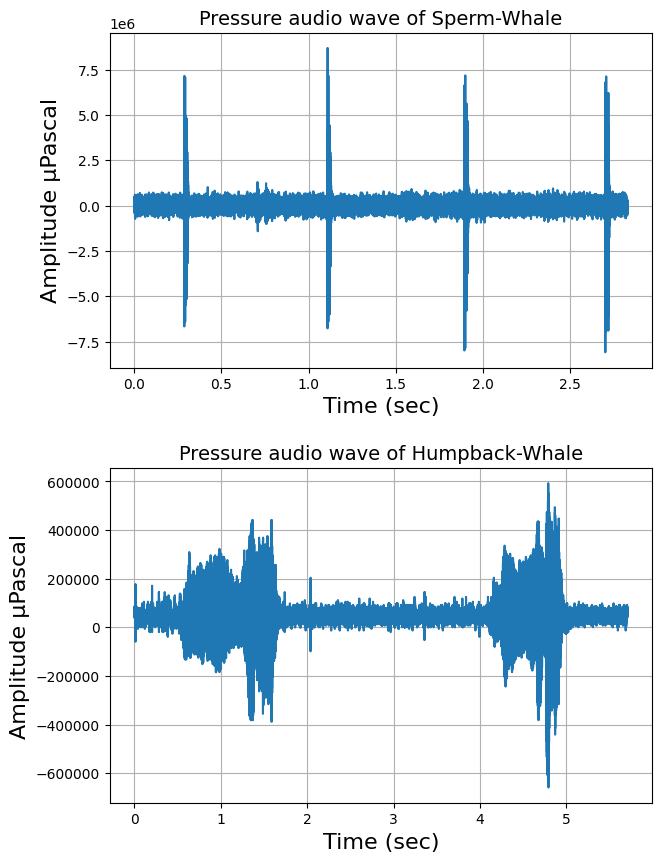

In [47]:
y_sperm, sr_sperm = librosa.load('85005006.wav', sr = None)
y_hump, sr_hump = librosa.load('9220100Q.wav', sr = None)

def pressure(y):
  GF = 0.16
  sensitivity = -155
  y = (y * 1.5 * GF)/(10**((sensitivity/20)))
  return y


sperm_press = pressure(y_sperm) # σε μPa
hump_press = pressure(y_hump) # σε μPa

time_to_sperm = np.linspace(0, len(sperm_press)/sr_sperm, len(sperm_press))
time_to_hump = np.linspace(0, len(hump_press)/sr_hump, len(hump_press))

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 10))

axs[0].plot(time_to_sperm, sperm_press)
axs[1].plot(time_to_hump, hump_press)
axs[0].set_title('Pressure audio wave of Sperm-Whale', fontsize=14)
axs[1].set_title('Pressure audio wave of Humpback-Whale', fontsize=14)
plt.subplots_adjust(hspace=0.3)

for i in range(2):
  axs[i].set_ylabel('Amplitude μPascal', fontsize=16)
  axs[i].set_xlabel('Time (sec)', fontsize=16)
  axs[i].grid()


Από τα διαγράμματα είναι φανερό ότι τα σήματα των δύο φαλαινών διαφέρουν αρκετά. Το σήμα sperm-whale αποτελείται από 4 απότομους σύντομους παλμούς, ενώ το humpback-whale είναι πιο ομοιόμορφο.

##Eρώτημα 3.2
---




Υπολογίζουμε τη μέση τετραγωνική ρίζα από τη δοσμένη σχέση
$$
p_{rms} = \sqrt{\frac{1}{N} \sum_{i=1}^{N} pressure_i^2}
$$
Χρησιμοποιούμε την εντολή np.mean() που υπολογίζει τον μέσο όρο του κάθε σήματος της πίεσης.  Το prms εκφράζει τη μέση ενέργεια του σήματος πίεσης σε ένα χρονικό διάστημα.

Υπολογίζουμε επίσης το spl (Sound Pressure Level) από τη σχέση
$$
SPL_{RMS} = 20 \log_{10} \left( \frac{p_{rms}}{p_{ref}} \right)
$$
Το SPLrms εκφράζει την ένταση του ήχου σε λογαριθμική κλίμακα dB, δηλαδή το μέσο επίπεδο ήχου.

In [48]:

prms_sperm = np.sqrt(np.mean(sperm_press**2))
prms_hump = np.sqrt(np.mean(hump_press**2))

p_ref = 1 # μPa
spl_sperm = 20 * np.log10(prms_sperm/p_ref)
spl_hump = 20 * np.log10(prms_hump/p_ref)

print(f'Sperm Whale: PRMS {prms_sperm:.5f} μPa, SPL {spl_sperm:.2f} dB')
print(f'Humpback Whale: PRMS {prms_hump:.5f} μPa, SPL {spl_hump:.2f} dB')

Sperm Whale: PRMS 336416.18750 μPa, SPL 110.54 dB
Humpback Whale: PRMS 83914.95312 μPa, SPL 98.48 dB


## Ερώτημα 3.3
---

Επιλέγουμε να επιβεβαιώσουμε για το σήμα sperm-whale το θεώρημα του Parseval. Χρησιμοποιούμε το σήμα πίεσης της sperm-whale και φτιάχνουμε τους δύο όρους του θεωρήματος. Περνάμε το σήμα pressure-sperm-whale από μετασχηματισμό Fourier με την numpy.fft.fft() και αξιοποιούμε τη εντολή np.sum() για να υπολογίσουμε τα αθροίσματα.






In [49]:
#For Sperm-Whale
SPERM_PRESS = np.fft.fft(sperm_press) #FFT OF SPERM
Parseval_sperm = np.sum(sperm_press**2)
Parseval_SPERM_FFT = np.sum(abs(SPERM_PRESS)**2)/len(SPERM_PRESS)
print(f'{Parseval_sperm:.0f} = {Parseval_SPERM_FFT:.0f}, deviation is {(Parseval_sperm - Parseval_SPERM_FFT)/Parseval_sperm:.10f} %')

26206092996378624 = 26206095143862272, deviation is -0.0000000819 %


Στο τέλος αφαιρούμε τους δύο όρους μεταξύ τους για να δείξουμε ότι η ποσοστιαία απόκλιση στα αποτελέσματα είναι πολύ μικρή. Άρα επιβεβαιώνεται το θεώρημα του Parseval.

## Ερώτημα 3.4
---
Φτιάχνουμε ένα Butterworth φίλτρο, το οποίο θα αποκόπτει τις συχνότητες κάτω των 200Hz, για να περιορίζεται ο ανθρωπογενής θόρυβος. Το φίλτρο είναι τάξης Ν=3 και δημιουργούμε μια συνάρτηση filtered_butter(). Στην υλοποίησή της χρησιμοποιούμε τις εντολές butter() και lfilter(), που δημιουργούν τους συντελεστές του υψιπερατού φίλτρου και το υλοποιούν αντίστοιχα.

Φιλτράρουμε τα δύο σήματα και τα πλοτάρουμε μαζί με τα σήματα Πίεσης-Χρόνου πριν εφαρμοστεί το φίλτρο, για να μελετήσουμε διαφορές και αποκλίσεις. (φιλτραρισμένο-πορτοκαλί, αφιλτράριστο-μπλε)



<ipython-input-50-f129de8416df>:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[i].legend()


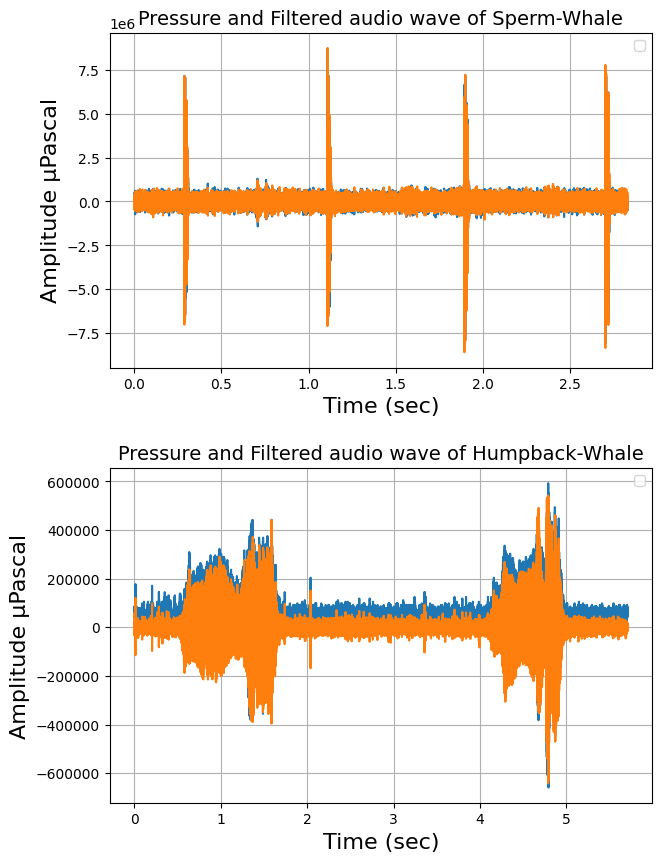

In [50]:
#kataskeui tou butterworth
cutoff_freq=200 #Hz
N=3

def filtered_butter (y, sr):
  b, a = butter(N, Wn = cutoff_freq, btype = 'high', analog = False, fs = sr)
  y_filtered = lfilter(b, a, y)
  return y_filtered

filtered_sperm = filtered_butter(sperm_press, sr_sperm)
filtered_hump = filtered_butter(hump_press, sr_hump)

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 10))

axs[0].plot(time_to_sperm, sperm_press)
axs[0].plot(time_to_sperm, filtered_sperm)
axs[1].plot(time_to_hump, hump_press)
axs[1].plot(time_to_hump, filtered_hump)

axs[0].set_title('Pressure and Filtered audio wave of Sperm-Whale', fontsize=14)
axs[1].set_title('Pressure and Filtered audio wave of Humpback-Whale', fontsize=14)
plt.subplots_adjust(hspace=0.3)

for i in range(2):
  axs[i].set_ylabel('Amplitude μPascal', fontsize=16)
  axs[i].set_xlabel('Time (sec)', fontsize=16)
  axs[i].grid()
  axs[i].legend()

Στο sperm-whale σήμα παρατηρούμε μικρές αποκλίσεις ανάμεσα στο φιλτραρισμένο και το αφιλτράριστο σήμα. Σε κάποια σημεία το πλάτος του φιλτραρισμένου σήματος είναι λίγο μικρότερο το οποίο είναι και αναμενόμενο, αφού αφαιρούμε τις χαμηλές συχνότητες που αποτελούν τα σταθερότερα σημεία του σήματος.

Στο humpback-whale παρατηρούμε αντίστοιχα μικρές αποκλίσεις με τη μόνη διαφορά ότι φαίνεται πως το φιλτραρισμένο σήμα είναι μετατοπισμένο προς τα κάτω στον άξονα y. Αυτό δικαιολογείται από την αφαίρεση των χαμηλότερων (σταθερών, όπως ήδη αναφέρθηκε) συχνοτήτων.


##Ερώτημα 3.5

---




Αρχικά φορτώνουμε με την librosa.load() το σήμα ανθρωπογενή θαλάσσιου ήχου.
Στη συνέχεια μετατρέπουμε το σήμα αυτό σε σήμα πίεσης noise_press και υπολογίζουμε με αντίστοιχο τρόπο με το ερώτημα 3.2 το prms και το SPLrms του θορύβου.


In [51]:
y_noise, sr_noise = librosa.load('Pile driving.wav')
p_ref = 1
GF = 0.16
sensitivity = -125
noise_press = ( y_noise* 1.5 * GF)/(10**((sensitivity/20)))

prms_noise = np.sqrt(np.mean(noise_press**2))

spl_noise = 20 * np.log10(prms_noise/p_ref)

print('SPL (before filter) is', spl_noise)



SPL (before filter) is 107.793434


Ελέγχουμε αρχικά για τη φάλαινα sperm-whale αν ενοχλείται από τον ανθρώπινο θόρυβο. Αφού ακούει σε όλο το φάσμα, το μόνο κριτήριο που πρέπει να ελέγξουμε είναι αν ο θόρυβος ξεπερνά τα 100dB. Χρησιμοποιούμε για τον έλεγχο αυτό το μέγεθος SPLrms που όπως είπαμε είναι το μέσο επίπεδο ήχου. Αν ξεπερνάει τα 100dB η if τυπώνει μέσα της το ανάλογο μήνυμα.




In [52]:
if(spl_noise > 100):
  print('😢😢😢😢😢😢😢😢😢😢 HARMFUL FOR SPERM 😢😢😢😢😢😢😢😢😢😢😢')
else:
  print('😊😊😊😊😊😊😊😊😊 NOT HARMFUL FOR SPERM 😊😊😊😊😊😊😊😊😊')



😢😢😢😢😢😢😢😢😢😢 HARMFUL FOR SPERM 😢😢😢😢😢😢😢😢😢😢😢


Ελέγχουμε τώρα αν ενοχλείται η φάλαινα humpback-whale. Επειδή η φάλαινα ακούει σε συχνότητες ανάμεσα στα 300-3000Hz, δημιουργούμε ένα ζωνοπερατό φίλτρο butter περιορισμένο σε αυτές τις συχνότητες, με sampling-rate τη συχνότητα δειγματοληψίας του θορύβου. Περνάμε το σήμα πίεσης θορύβου από το φίλτρο και υπολογίζουμε εκ’ νέου prms, SPLrms. Με την ίδια λογική συγκρίνουμε το SPLrms του φιλτραρισμένου θορύβου και αν είναι μεγαλύτερο των 100 dB, συμπεραίνουμε ότι η humpback φάλαινα ενοχλείται.

In [53]:
b, a = butter(N ,[300,3000], btype = 'bandpass', fs = sr_noise)
noise_filtered = lfilter(b, a, noise_press)

prms_noise_filtered = np.sqrt(np.mean(noise_filtered**2))
spl_noise_filtered = 20 * np.log10(prms_noise_filtered/p_ref)

print('SPL (after filter) is', spl_noise_filtered)

if(spl_noise_filtered > 100):
  print('😢😢😢😢😢😢😢😢😢😢 HARMFUL FOR HUMPBACK 😢😢😢😢😢😢😢😢😢😢😢')
else:
  print('😊😊😊😊😊😊😊😊😊 NOT HARMFUL FOR HUMPBACK 😊😊😊😊😊😊😊😊😊')


SPL (after filter) is 84.15848911730171
😊😊😊😊😊😊😊😊😊 NOT HARMFUL FOR HUMPBACK 😊😊😊😊😊😊😊😊😊


Παρατηρούμε το SPL του φιλτραρισμένου σήματος να είναι μικρότερο από το αφιλτράριστο και αυτό γιατί συνήθως οι θόρυβοι που προκαλούνται από τον άνθρωπο είναι μικρότεροι των 300Hz (έχουν μικρή συχνότητα).

##Ερώτημα 3.6

---
Για να υπολογίσουμε την ενέργεια βραχέος χρόνου (Short-Time Energy), ακολουθούμε την ίδια διαδικασία με το ερώτημα 2.2. Δηλαδή φτιάχνουμε ένα παράθυρο Hamming και με την εντολή np.convolve() προκύπτει η short-time energy του κάθε σήματος.
Πλοτάρουμε το αρχικό σήμα Πίεσης Χρόνου και αυτό της ενέργειας για το κάθε σήμα.




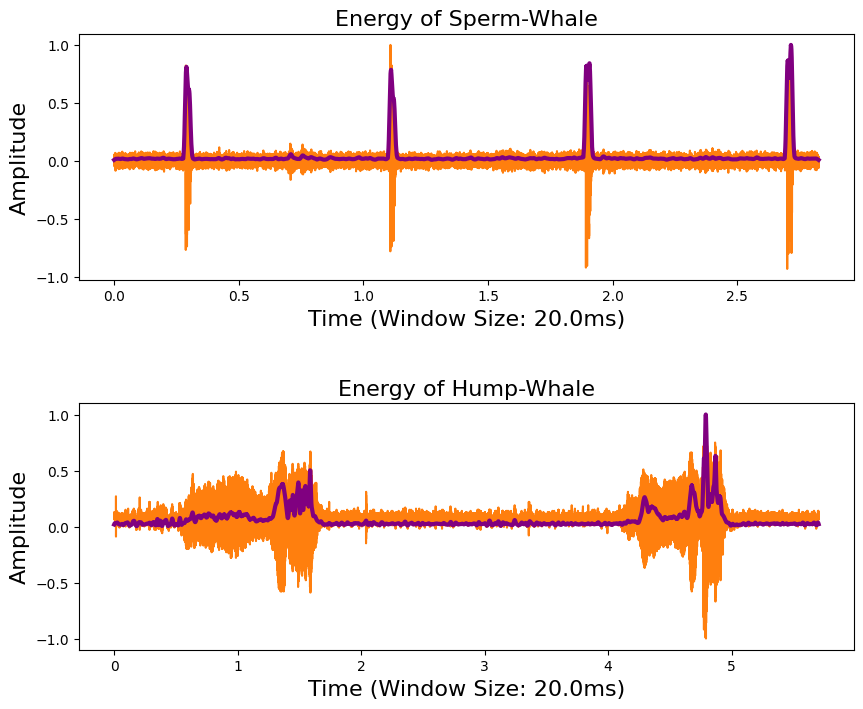

In [54]:
window_size = 0.02
sperm_squared = y_sperm*y_sperm
hump_squared = y_hump*y_hump

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

hamming_sperm = np.hamming(window_size*sr_sperm)
hamming_hump = np.hamming(window_size*sr_hump)

energy_sperm = []
enregy_hump = []

energy_sperm = np.convolve(sperm_squared, hamming_sperm, mode='same')
energy_hump = np.convolve(hump_squared, hamming_hump, mode='same')

normalised_sperm = energy_sperm / np.max(abs(energy_sperm))
normalised_hump = energy_hump / np.max(abs(energy_hump))

normalised_press_sperm = sperm_press / np.max(abs(sperm_press))
normalised_press_hump = hump_press / np.max(abs(hump_press))

axs[0].plot(time_to_sperm, normalised_sperm)
axs[0].plot(time_to_sperm, normalised_press_sperm)
axs[1].plot(time_to_hump, normalised_hump)
axs[1].plot(time_to_hump, normalised_press_hump)

axs[0].set_title('Energy of Sperm-Whale', fontsize=16)
axs[1].set_title('Energy of Hump-Whale', fontsize=16)
axs[0].plot(time_to_sperm, normalised_sperm, color="purple", linewidth=3)
axs[1].plot(time_to_hump, normalised_hump, color="purple", linewidth=3)
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
axs[1].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
plt.subplots_adjust(hspace=0.5)

Αυτό που παρατηρούμε είναι ότι η ενέργεια ακολουθεί το σήμα πίεσης και μοιάζει με την περιβάλλουσα του. Βέβαια έχει μικρότερο πλάτος από το αρχικό σήμα πίεσης, όπως έχουν εξάλλου και τα φιλτραρισμένα σήματα. Η ενέργεια φαίνεται να είναι υψηλή σε έμφωνιυς ήχους.


##Ερώτημα 3.7

---
Εφαρμόζουμε τον μη-γραμμικό ενεργειακό τελεστή Teager-Kaiser Energy Operator στα σήματα πίεσης-χρόνου των σημάτων των φαλαινών. Ο τελεστής αυτός για διακριτά σήματα δίνεται από τη σχέση $$
\Psi[p[n]] = p^2[n] - p[n-1]p[n+1]
$$


Με τον τρόπο αυτό περιμένουμε να τονιστουν τα σημεία εντονότερης ενέργειας στο σήμα μας. Ο τελεστής εξυπηρετεί στον υπολογισμό της στιγμιαίας ενέργειας.

Για να εφαρμόσουμε τον συντελεστή αυτό δημιουργούμε τη συνάρτηση teager_kaiser(), παίρνοντας περιπτώσεις για τα άκρα του σήματος.

Εφαρμόζουμε τη συνάρτηση και πλοτάρουμε το σήμα πίεσης και το σήμα ενέργειας teager-kaiser για το κάθε βιοσήμα ξεχωριστά.



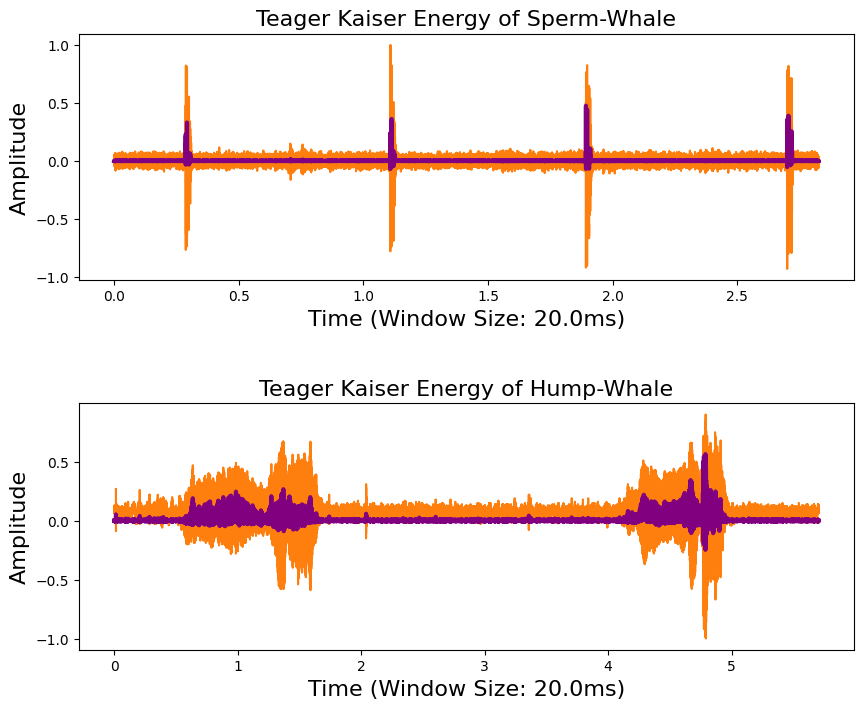

In [55]:
def teager_kaiser(p):
  length_p=len(p)
  teager_kaiser=[]
  for i in range(0, length_p):
    if i==0:
      teager_kaiser.append(p[i]**2-p[i]*p[i+1])
    elif i==length_p-1:
      teager_kaiser.append(p[i]**2-p[i-1]*p[i])
    else:
      teager_kaiser.append(p[i]**2-p[i-1]*p[i+1])
  return teager_kaiser

fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

teager_kaiser_sperm = teager_kaiser(normalised_press_sperm)
teager_kaiser_hump = teager_kaiser(normalised_press_hump)

axs[0].plot(time_to_sperm, teager_kaiser_sperm)
axs[0].plot(time_to_sperm, normalised_press_sperm)
axs[1].plot(time_to_hump, teager_kaiser_hump)
axs[1].plot(time_to_hump, normalised_press_hump)

axs[0].set_title('Teager Kaiser Energy of Sperm-Whale', fontsize=16)
axs[1].set_title('Teager Kaiser Energy of Hump-Whale', fontsize=16)
axs[0].plot(time_to_sperm, teager_kaiser_sperm, color="purple", linewidth=3)
axs[1].plot(time_to_hump, teager_kaiser_hump, color="purple", linewidth=3)
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
axs[1].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
plt.subplots_adjust(hspace=0.5)

Αυτό που παρατηρούμε είναι ότι το σήμα teager-kaiser και στα δύο βιοσήματα έχει πολύ μικρότερα πλάτη ενέργειας και σε σύγκριση με το αρχικό σήμα πίεσης αλλά και σε σχέση με το short-time energy που είδαμε προηγουμένως.
Επίσης, παρατηρούμε ότι σε αντίθεση με προηγουμένως η ενέργεια teager-kaiser παίρνει και κάποιες αρνητικές τιμές.


Επαναλαμβάνουμε την ίδια διαδικασία αυτή τη φορά για φιλτραρισμένα σήματα.

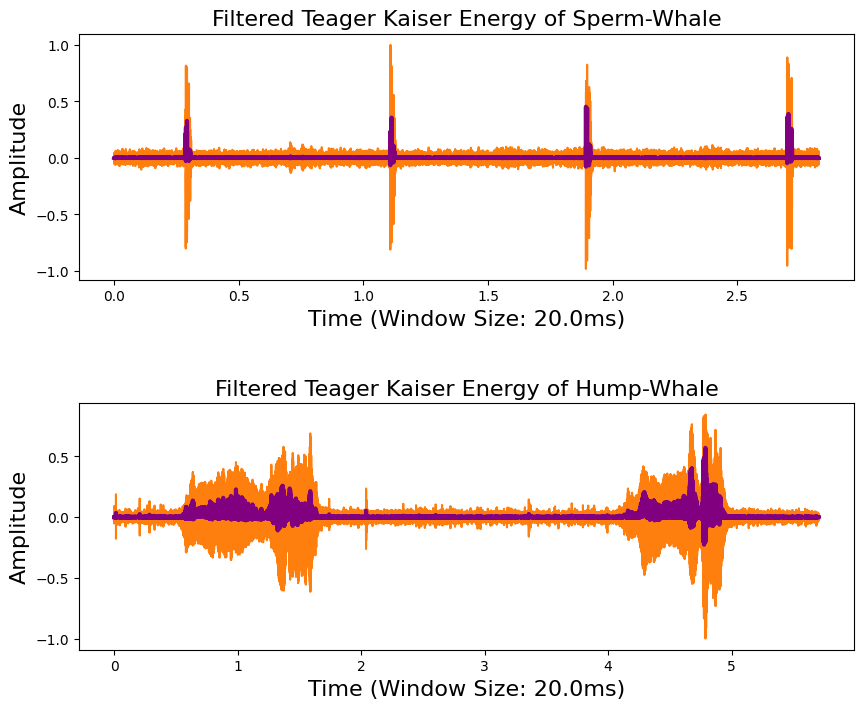

In [56]:
fig,axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

normalised_filtered_sperm = filtered_sperm/np.max(abs(filtered_sperm))
normalised_filtered_hump = filtered_hump/np.max(abs(filtered_hump))

teager_kaiser_sperm = teager_kaiser(normalised_filtered_sperm)
teager_kaiser_hump = teager_kaiser(normalised_filtered_hump)

axs[0].plot(time_to_sperm, teager_kaiser_sperm)
axs[0].plot(time_to_sperm, normalised_filtered_sperm)
axs[1].plot(time_to_hump, teager_kaiser_hump)
axs[1].plot(time_to_hump, normalised_filtered_hump)

axs[0].set_title('Filtered Teager Kaiser Energy of Sperm-Whale', fontsize=16)
axs[1].set_title('Filtered Teager Kaiser Energy of Hump-Whale', fontsize=16)
axs[0].plot(time_to_sperm, teager_kaiser_sperm, color="purple", linewidth=3)
axs[1].plot(time_to_hump, teager_kaiser_hump, color="purple", linewidth=3)
axs[0].set_ylabel('Amplitude', fontsize=16)
axs[1].set_ylabel('Amplitude', fontsize=16)
axs[0].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
axs[1].set_xlabel(f'Time (Window Size: {window_size*1000}ms)', fontsize=16)
plt.subplots_adjust(hspace=0.5)

Παρατηρούμε ελάχιστες διαφορές, μια εκ των οποίων είναι η μικρή μετατόπιση του σήματος ενέργειας teager-kaiser της humpback whale προς τα κάτω στον άξονα y, κάτι που όπως εξηγήθηκε οφείλεται στην αποκοπή των χαμηλών συχνοτήτων.
Συνολικά ο συντελεστής teager-kaiser προσφέρει ένα πιο συμπαγές σήμα σε αντίθεση με το σήμα περιβάλλουσας της short-time energy του προηγούμενου ερωτήματος.


##Eρώτημα 3.8

---
Σχεδιάζουμε το περιοδόγραμμα του Welch  με τη χρήση της συνάρτησης sc.welch(). Tο διάγραμμα αυτό εκφράζει πόση ενέργεια του κατανέμεται σε κάθε συχνότητα.

Υπολογίζουμε το περιοδόγραμμα για το φιλτραρισμένο και το αφιλτράριστο σήμα της κάθε φάλαινας.




Text(0.5, 1.0, 'Welch Diagram in semi-logarithmic scale for Sperm Whale')

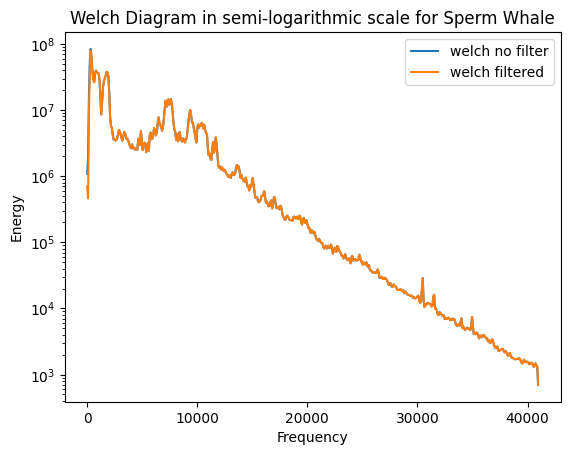

In [57]:
welsh_sperm, sperm_den = sc.welch(sperm_press, sr_sperm, nperseg=1024)
plt.semilogy(welsh_sperm, sperm_den, label='welch no filter')

welsh_sperm_filt, sperm_den_filt = sc.welch(filtered_sperm, sr_sperm, nperseg=1024)
plt.semilogy(welsh_sperm_filt, sperm_den_filt, label='welch filtered')
plt.legend()
plt.ylabel('Energy')
plt.xlabel('Frequency')
plt.title('Welch Diagram in semi-logarithmic scale for Sperm Whale')


Παρατηρούμε ότι για το sperm-whale signal το περιοδόγραμμα του φιλτραρισμένου και του αφιλτραριστου σήματος συμπίπτουν σε μεγάλο βαθμό. Η βασική τους διαφορά είναι στις χαμηλές συχνότητες, όπου το φιλτραρισμένο σήμα έχει μικρότερη ενέργεια, κάτι το αναμενόμενο γιατί για συχνότητες κάτω των 200 Hz η ενέργεια του φιλτραρισμένου είναι κοντά στο 0.


Text(0.5, 1.0, 'Welch Diagram in semi-logarithmic scale for Humpback Whale')

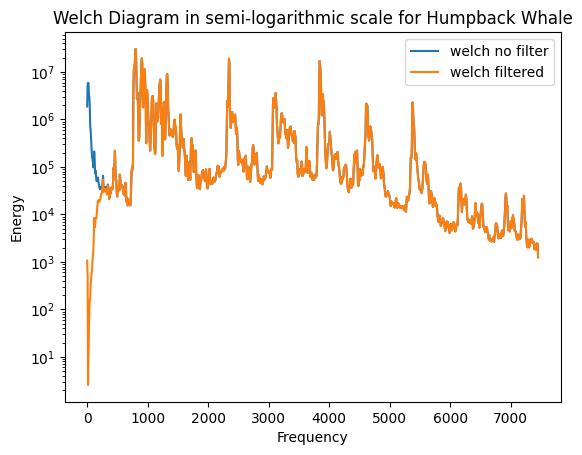

In [58]:
welsh_hump, hump_den = sc.welch(hump_press, sr_hump, nperseg=2048)
plt.semilogy(welsh_hump, hump_den, label='welch no filter')

welsh_hump_filt, hump_den_filt = sc.welch(filtered_hump, sr_hump, nperseg=2048)
plt.semilogy(welsh_hump_filt, hump_den_filt, label='welch filtered')
plt.legend()
plt.ylabel('Energy')
plt.xlabel('Frequency')
plt.title('Welch Diagram in semi-logarithmic scale for Humpback Whale')

Για το humpback-whale signal παρατηρούμε μεγάλη διαφορά στις χαμηλές συχνότητες ανάμεσα στο φιλτραρισμένο και το αφιλτράριστο σήμα. Αυτό οφείλεται και πάλι στην απομόνωση των συχνοτήτων άνω των 200 Hz. Η απόκλιση σε σχέση με το sperm-whale είναι μεγαλύτερη όμως γιατί το αρχικό σήμα του humpback-whale ήταν εξαρχής πιο ομοιόμορφο με μουγκριτά και χωρίς απότομους παλμούς.


##Ερώτημα 3.9

---
Υπολογίζουμε με τη συνάρτηση librosa.stft() τον μετασχηματισμό Fourier των βιοσημάτων.

Με τη συνάρτηση librosa.amplitude_to_db() υπολογίζουμε σε dB το πλάτος του μετασχηματισμού Fourier των σημάτων και με τη librosa.display.specshow() σχεδιάζουμε το φασματογράφημα των βιοσημάτων.



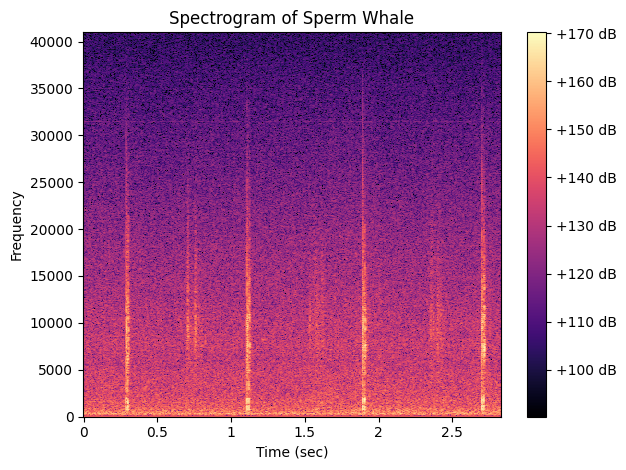

In [59]:
fourier_sperm = abs(librosa.stft(sperm_press))
f_db_sperm = librosa.amplitude_to_db(fourier_sperm)
librosa.display.specshow(f_db_sperm, sr = sr_sperm, x_axis='time', y_axis='hz')

plt.ylabel('Frequency')
plt.xlabel('Time (sec)')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Sperm Whale')
plt.tight_layout()


Στο φασματογράφημα της sperm-whale παρατηρούμε τους 4 απότομους παλμούς του αρχικού σήματος. Ενδιάμεσα παρεμβάλλονται θόρυβοι από ανθρωπογενείς και θαλάσσιους παράγοντες, μικρότερης βέβαια έντασης.



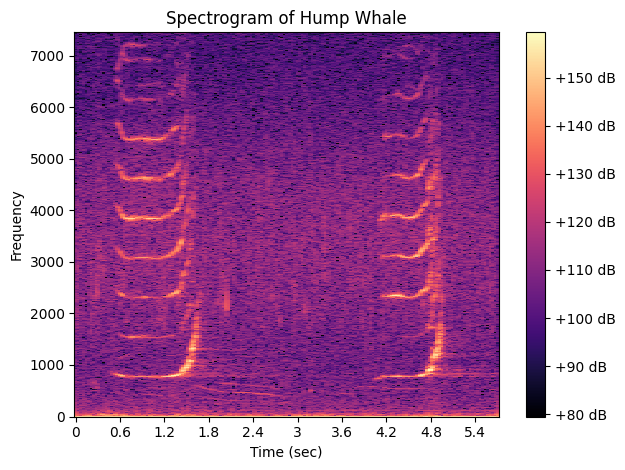

In [60]:
fourier_hump = librosa.stft(hump_press)

f_db_hump = librosa.amplitude_to_db(np.abs(fourier_hump))


librosa.display.specshow(f_db_hump, sr = sr_hump, x_axis='time', y_axis='hz')
plt.ylabel('Frequency')
plt.xlabel('Time (sec)')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Hump Whale')
plt.tight_layout()


Στο φασματογράφημα humpback-whale αντίστοιχα παρατηρούμε το φάσμα συχνοτήτων της hump-back whale (πορτοκαλΪ χρώμα) και θόρυβο ανάμεσα. Οι δύο “λωρίδες” που δημιουργούνται οφείλονται στα δύο μουγκρητά της φάλαινας στην αρχή και το τέλος του σήματος, ενώ ενδιάμεσα παρεμβάλλεται κυρίως θόρυβος και όχι τόσο ήχος της φάλαινας.

Το φασματογράφημα του sperm-whale το περιοδόγραμμα Welch γιατί μέχρι τα 10 kHz πράγματι η ένταση/ενέργεια είναι πολύ έντονη και σταδιακά μειώνεται, ενώ σε χαμηλές το χρώμα στο φασματογράφημα είναι μαύρο.
Αντίστοιχα στο φασματογράφημα του humpback whale βλέπουμε μαύρο χρώμα που επιβεβαιώνει την απότομη πτώση του διαγράμματος Welch και στη συνέχεια μαυρίζει για διάφορες συχνότητες όπως άλλωστε και στο διάγραμμα Welch οι χαμηλές και υψηλές τιμές ενέργειας εναλλάσσονται.


### 3.10
---

Δημιουργούμε τα mel spectogram χρησιμοποιώντας τις συναρτήσεις που δόθηκαν:

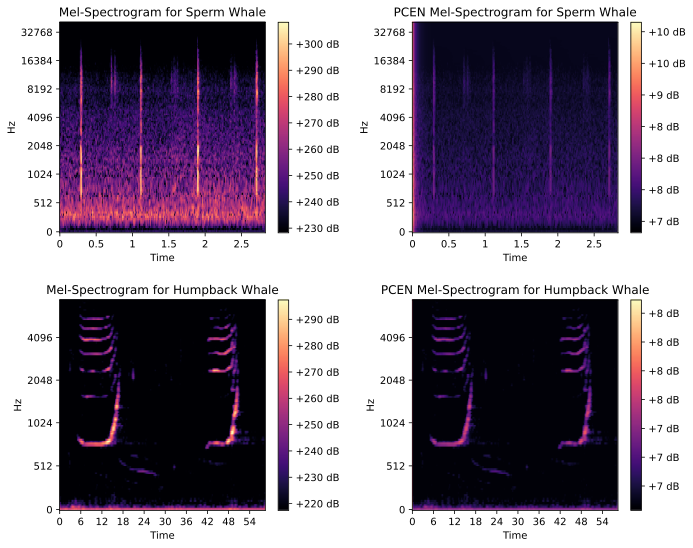

In [63]:
fig,axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 8))

mel_sperm= librosa.feature.melspectrogram(y=sperm_press, sr = sr_sperm)
mel_db_sperm = librosa.amplitude_to_db(mel_sperm)
pcen_mel_sperm=librosa.pcen(mel_db_sperm, sr = sr_sperm, gain = 0.25, bias=0.5, time_constant=0.03, hop_length = 256)

plt.subplot(2, 2, 1)
librosa.display.specshow(mel_db_sperm,sr = sr_sperm, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-Spectrogram for Sperm Whale')

plt.subplot(2, 2, 2)
librosa.display.specshow(pcen_mel_sperm,sr =sr_sperm, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('PCEN Mel-Spectrogram for Sperm Whale')

mel_hump = librosa.feature.melspectrogram(y=hump_press, sr = sr_hump, hop_length = 50)
mel_db_hump = librosa.amplitude_to_db(mel_hump)
pcen_mel_hump = librosa.pcen(mel_db_hump, sr = sr_hump, gain = 0.25, bias=0.5, time_constant=0.03, hop_length = 256)

plt.subplot(2, 2, 3)
librosa.display.specshow(mel_db_hump,sr =sr_hump,  x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-Spectrogram for Humpback Whale')

plt.subplot(2, 2, 4)
librosa.display.specshow(pcen_mel_hump, sr = sr_hump, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('PCEN Mel-Spectrogram for Humpback Whale')

plt.tight_layout(pad=2.0)

Το mel spectrogram είναι μια εικόνα που δείχνει πώς αλλάζει ο ήχος μας με το πέρασμα του χρόνου. Αντί για μια απλή γραμμική εικόνα, χρησιμοποιούμε την κλίμακα Mel που προσαρμόζεται καλύτερα στο πώς ακούει ο άνθρωπος. Έτσι, εμείς βλέπουμε πιο λεπτομερώς τις χαμηλές συχνότητες, που είναι πιο σημαντικές για την αντίληψή μας, και τις υψηλές εμφανίζονται πιο συμπιεσμένες.

Το PCEN Mel spectrogram είναι σαν μια «βελτιωμένη» έκδοση του mel spectrogram. Εμείς προσθέτουμε ένα φίλτρο που βοηθά να μειώσουμε τον θόρυβο και τις μεγάλες μεταβολές στην ένταση του ήχου. Με αυτόν τον τρόπο, η εικόνα γίνεται πιο ομαλή και καθαρή, και εμείς μπορούμε να εντοπίσουμε πιο εύκολα τα σημαντικά σημεία του ήχου.